# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = '/data'
!pip install matplotlib==2.0.2
# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

    100% |████████████████████████████████| 14.6MB 36kB/s  eta 0:00:01   14% |████▋                           | 2.1MB 39.0MB/s eta 0:00:01
  Found existing installation: matplotlib 2.1.0
    Uninstalling matplotlib-2.1.0:
      Successfully uninstalled matplotlib-2.1.0
You are using pip version 9.0.1, however version 18.1 is available.
You should consider upgrading via the 'pip install --upgrade pip' command.
Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

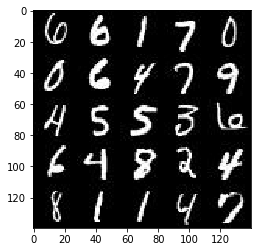

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

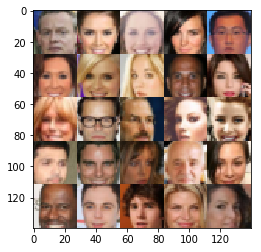

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.3.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input_img = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], name="real_input_img")
    inputs_z = tf.placeholder(tf.float32, [None, z_dim], name="input_z") 
    learning_rate = tf.placeholder(tf.float32, name="learning_rate")
    return real_input_img, inputs_z, learning_rate


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
['File "/opt/conda/lib/python3.6/runpy.py", line 193, in _run_module_as_main\n    "__main__", mod_spec)', 'File "/opt/conda/lib/python3.6/runpy.py", line 85, in _run_code\n    exec(code, run_globals)', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel_launcher.py", line 16, in <module>\n    app.launch_new_instance()', 'File "/opt/conda/lib/python3.6/site-packages/traitlets/config/application.py", line 658, in launch_instance\n    app.start()', 'File "/opt/conda/lib/python3.6/site-packages/ipykernel/kernelapp.py", line 497, in start\n    self.io_loop.start()', 'File "/opt/conda/lib/python3.6/site-packages/tornado/ioloop.py", line 832, in start\n    self._run_callback(self._callbacks.popleft())', 'File

### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [16]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    alpha = 0.12
    with tf.variable_scope('discriminator', reuse=reuse):
        #shape 28x28x3
        x1 = tf.layers.conv2d(images, 64, 5, strides=2,padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        relu1 = tf.maximum(x1*alpha, x1)
        drop1 = tf.layers.dropout(relu1, rate=0.2)
        
        #Creating 2nd Conv layer
        x2 = tf.layers.conv2d(drop1, 128, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(bn2 * alpha, bn2)
        drop2 = tf.layers.dropout(relu2, rate=0.2)
        #reshape 7x7x128
        
        #Creating 3rd conv layer
        x3 = tf.layers.conv2d(drop2, 256, 5, strides=2, padding='same', kernel_initializer=tf.contrib.layers.xavier_initializer())
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(bn3 * alpha, bn3)
        drop3 = tf.layers.dropout(relu3, rate=0.2)
        #reshape 7x7x128
        
        flat = tf.reshape(drop3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [17]:
def generator(z, out_channel_dim, is_train=True):
    """h a scope name of "generator" to allow the variables to be reus
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.12
    with tf.variable_scope('generator', reuse=not is_train):
        #Fully connected layer
        x1 = tf.layers.dense(z, 7*7*256)
        
        #reshape and deconv - 7x7x256
        x1 = tf.reshape(x1, (-1,7,7,256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        
        #2nd Conv Layer - 14x14x128
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2,training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        
        #3rd Conv Layer - 28x28x64
        x3 = tf.layers.conv2d_transpose(x2, 64, 5, strides=2, padding='same')
        x3 = tf.layers.batch_normalization(x3,training=is_train)
        x3 = tf.maximum(alpha * x3, x3)
        
        drop = tf.nn.dropout(x3, keep_prob=0.5)
               
        # Output layer
        logits = tf.layers.conv2d_transpose(drop, out_channel_dim, 5, strides=1, padding='same')
                               
        return tf.tanh(logits)
        
    
        

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [18]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    smooth = 0.12 # label smoothing
    
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)*(1 - smooth)))
    
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake
        
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [19]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    
    d_updates = [opt for opt in update_ops if opt.name.startswith('discriminator')]
    g_updates = [opt for opt in update_ops if opt.name.startswith('generator')]

    with tf.control_dependencies(d_updates):
        d_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)

    with tf.control_dependencies(g_updates):
        g_opt = tf.train.AdamOptimizer(learning_rate=learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
            
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [20]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [21]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    print_every=10 
    show_every=100
    
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])
    d_opt, g_opt = model_opt(d_loss, g_loss, learning_rate, beta1)
    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
     
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                batch_images *= 2
                
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z})
                _ = sess.run(g_opt, feed_dict={input_z: batch_z})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_z: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i + 1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % show_every == 0:
                    show_generator_output(sess, 25, input_z, data_shape[3], data_image_mode)
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Discriminator Loss: 2.3275... Generator Loss: 0.2481
Epoch 1/2... Discriminator Loss: 1.2997... Generator Loss: 3.1836
Epoch 1/2... Discriminator Loss: 1.3756... Generator Loss: 2.8100
Epoch 1/2... Discriminator Loss: 1.1416... Generator Loss: 2.2052
Epoch 1/2... Discriminator Loss: 1.0771... Generator Loss: 1.2245
Epoch 1/2... Discriminator Loss: 1.6812... Generator Loss: 0.3717
Epoch 1/2... Discriminator Loss: 1.0829... Generator Loss: 0.9168
Epoch 1/2... Discriminator Loss: 1.2278... Generator Loss: 1.2198
Epoch 1/2... Discriminator Loss: 1.2492... Generator Loss: 1.7367
Epoch 1/2... Discriminator Loss: 1.1306... Generator Loss: 1.4247


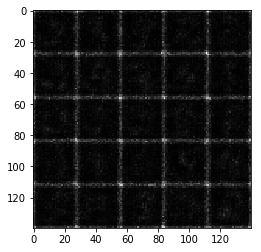

Epoch 1/2... Discriminator Loss: 1.1428... Generator Loss: 1.3954
Epoch 1/2... Discriminator Loss: 1.3579... Generator Loss: 1.9091
Epoch 1/2... Discriminator Loss: 0.9174... Generator Loss: 1.1856
Epoch 1/2... Discriminator Loss: 1.0196... Generator Loss: 0.9321
Epoch 1/2... Discriminator Loss: 2.0076... Generator Loss: 0.3033
Epoch 1/2... Discriminator Loss: 1.0577... Generator Loss: 1.6758
Epoch 1/2... Discriminator Loss: 2.0103... Generator Loss: 0.2985
Epoch 1/2... Discriminator Loss: 1.2462... Generator Loss: 2.4502
Epoch 1/2... Discriminator Loss: 1.2853... Generator Loss: 2.1859
Epoch 1/2... Discriminator Loss: 0.8739... Generator Loss: 2.2486


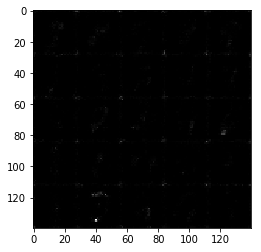

Epoch 1/2... Discriminator Loss: 1.3482... Generator Loss: 0.6296
Epoch 1/2... Discriminator Loss: 1.0484... Generator Loss: 0.9486
Epoch 1/2... Discriminator Loss: 0.9342... Generator Loss: 1.2233
Epoch 1/2... Discriminator Loss: 1.0755... Generator Loss: 1.6162
Epoch 1/2... Discriminator Loss: 1.2859... Generator Loss: 0.6447
Epoch 1/2... Discriminator Loss: 1.5927... Generator Loss: 0.4747
Epoch 1/2... Discriminator Loss: 1.4146... Generator Loss: 2.0606
Epoch 1/2... Discriminator Loss: 1.7163... Generator Loss: 0.3997
Epoch 1/2... Discriminator Loss: 1.4671... Generator Loss: 0.4954
Epoch 1/2... Discriminator Loss: 0.8803... Generator Loss: 1.3928


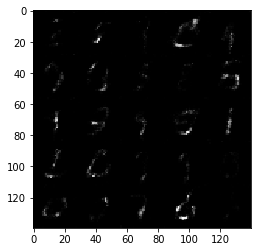

Epoch 1/2... Discriminator Loss: 1.1481... Generator Loss: 0.8867
Epoch 1/2... Discriminator Loss: 1.0379... Generator Loss: 0.9083
Epoch 1/2... Discriminator Loss: 1.7013... Generator Loss: 0.4511
Epoch 1/2... Discriminator Loss: 1.2401... Generator Loss: 0.6596
Epoch 1/2... Discriminator Loss: 1.0367... Generator Loss: 1.4019
Epoch 1/2... Discriminator Loss: 0.9641... Generator Loss: 1.7488
Epoch 1/2... Discriminator Loss: 1.1910... Generator Loss: 0.6880
Epoch 1/2... Discriminator Loss: 1.0790... Generator Loss: 0.9850
Epoch 1/2... Discriminator Loss: 1.3982... Generator Loss: 0.5579
Epoch 1/2... Discriminator Loss: 1.0747... Generator Loss: 1.2079


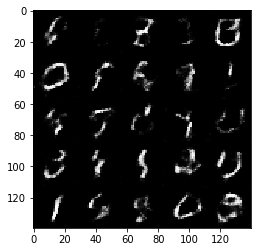

Epoch 1/2... Discriminator Loss: 1.4676... Generator Loss: 2.7918
Epoch 1/2... Discriminator Loss: 1.0198... Generator Loss: 1.1323
Epoch 1/2... Discriminator Loss: 1.6927... Generator Loss: 0.3765
Epoch 1/2... Discriminator Loss: 1.1361... Generator Loss: 0.9236
Epoch 1/2... Discriminator Loss: 0.8873... Generator Loss: 1.4184
Epoch 1/2... Discriminator Loss: 1.3222... Generator Loss: 0.5915
Epoch 1/2... Discriminator Loss: 1.2353... Generator Loss: 0.6093
Epoch 1/2... Discriminator Loss: 0.9227... Generator Loss: 1.2963
Epoch 1/2... Discriminator Loss: 1.1214... Generator Loss: 0.6764
Epoch 1/2... Discriminator Loss: 1.2114... Generator Loss: 1.5461


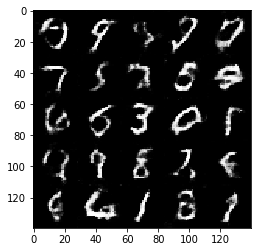

Epoch 1/2... Discriminator Loss: 1.7377... Generator Loss: 0.3545
Epoch 1/2... Discriminator Loss: 1.3204... Generator Loss: 0.5825
Epoch 1/2... Discriminator Loss: 0.9966... Generator Loss: 0.9524
Epoch 1/2... Discriminator Loss: 1.0821... Generator Loss: 1.8289
Epoch 1/2... Discriminator Loss: 1.1401... Generator Loss: 0.7873
Epoch 1/2... Discriminator Loss: 1.0774... Generator Loss: 1.7658
Epoch 1/2... Discriminator Loss: 1.1085... Generator Loss: 0.8552
Epoch 1/2... Discriminator Loss: 1.0380... Generator Loss: 1.3634
Epoch 1/2... Discriminator Loss: 1.2667... Generator Loss: 1.7115
Epoch 1/2... Discriminator Loss: 0.9199... Generator Loss: 1.3143


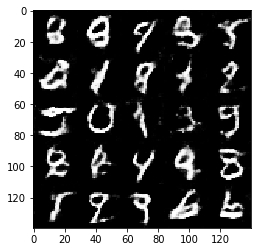

Epoch 1/2... Discriminator Loss: 0.9880... Generator Loss: 1.3416
Epoch 1/2... Discriminator Loss: 1.2729... Generator Loss: 0.6539
Epoch 1/2... Discriminator Loss: 1.3549... Generator Loss: 0.5252
Epoch 1/2... Discriminator Loss: 1.6353... Generator Loss: 0.3621
Epoch 1/2... Discriminator Loss: 1.3811... Generator Loss: 0.6272
Epoch 1/2... Discriminator Loss: 1.1632... Generator Loss: 0.7721
Epoch 1/2... Discriminator Loss: 0.8788... Generator Loss: 1.1928
Epoch 1/2... Discriminator Loss: 1.1338... Generator Loss: 0.6513
Epoch 1/2... Discriminator Loss: 1.2182... Generator Loss: 1.7902
Epoch 1/2... Discriminator Loss: 0.9673... Generator Loss: 1.0400


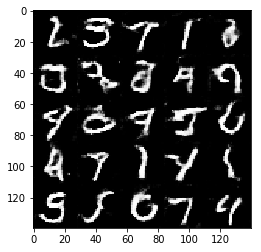

Epoch 1/2... Discriminator Loss: 0.9861... Generator Loss: 1.0725
Epoch 1/2... Discriminator Loss: 1.0266... Generator Loss: 1.5477
Epoch 1/2... Discriminator Loss: 1.0364... Generator Loss: 1.5094
Epoch 1/2... Discriminator Loss: 1.0544... Generator Loss: 0.7835
Epoch 1/2... Discriminator Loss: 1.0098... Generator Loss: 1.1296
Epoch 1/2... Discriminator Loss: 1.6101... Generator Loss: 0.4072
Epoch 1/2... Discriminator Loss: 1.3131... Generator Loss: 0.5559
Epoch 1/2... Discriminator Loss: 0.8129... Generator Loss: 1.5235
Epoch 1/2... Discriminator Loss: 0.9010... Generator Loss: 1.5606
Epoch 1/2... Discriminator Loss: 1.2935... Generator Loss: 2.2512


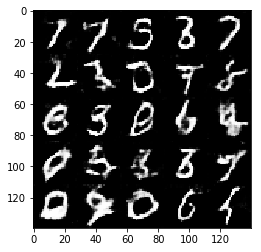

Epoch 1/2... Discriminator Loss: 1.2590... Generator Loss: 0.6537
Epoch 1/2... Discriminator Loss: 0.9114... Generator Loss: 1.0177
Epoch 1/2... Discriminator Loss: 1.1608... Generator Loss: 2.1217
Epoch 1/2... Discriminator Loss: 1.1587... Generator Loss: 0.7145
Epoch 1/2... Discriminator Loss: 1.4719... Generator Loss: 2.3203
Epoch 1/2... Discriminator Loss: 0.8428... Generator Loss: 1.6146
Epoch 1/2... Discriminator Loss: 0.9760... Generator Loss: 1.3489
Epoch 1/2... Discriminator Loss: 0.9289... Generator Loss: 1.3098
Epoch 1/2... Discriminator Loss: 1.2419... Generator Loss: 0.6472
Epoch 1/2... Discriminator Loss: 1.0566... Generator Loss: 0.9378


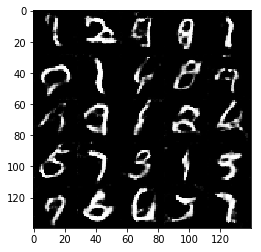

Epoch 1/2... Discriminator Loss: 2.4488... Generator Loss: 0.2051
Epoch 1/2... Discriminator Loss: 0.9417... Generator Loss: 1.3413
Epoch 1/2... Discriminator Loss: 0.9958... Generator Loss: 1.0881
Epoch 1/2... Discriminator Loss: 0.8587... Generator Loss: 1.4685
Epoch 1/2... Discriminator Loss: 0.9012... Generator Loss: 1.4963
Epoch 1/2... Discriminator Loss: 0.9306... Generator Loss: 1.7324
Epoch 1/2... Discriminator Loss: 1.3494... Generator Loss: 0.5828
Epoch 1/2... Discriminator Loss: 0.8651... Generator Loss: 1.0706
Epoch 1/2... Discriminator Loss: 1.1145... Generator Loss: 1.6129
Epoch 1/2... Discriminator Loss: 1.5682... Generator Loss: 0.4541


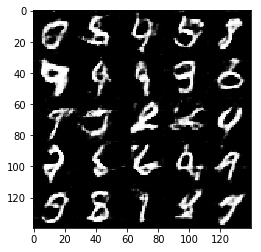

Epoch 1/2... Discriminator Loss: 0.8499... Generator Loss: 2.0049
Epoch 1/2... Discriminator Loss: 0.9523... Generator Loss: 0.9704
Epoch 1/2... Discriminator Loss: 0.8512... Generator Loss: 1.8052
Epoch 1/2... Discriminator Loss: 1.1102... Generator Loss: 1.8583
Epoch 1/2... Discriminator Loss: 0.9474... Generator Loss: 1.0124
Epoch 1/2... Discriminator Loss: 0.8850... Generator Loss: 1.0568
Epoch 1/2... Discriminator Loss: 0.7808... Generator Loss: 1.8239
Epoch 1/2... Discriminator Loss: 0.8504... Generator Loss: 1.3291
Epoch 1/2... Discriminator Loss: 0.9511... Generator Loss: 1.0031
Epoch 1/2... Discriminator Loss: 0.9961... Generator Loss: 1.2928


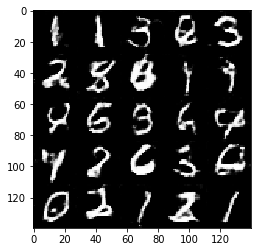

Epoch 1/2... Discriminator Loss: 1.5064... Generator Loss: 0.5095
Epoch 1/2... Discriminator Loss: 1.5359... Generator Loss: 0.4905
Epoch 1/2... Discriminator Loss: 1.0728... Generator Loss: 0.9316
Epoch 1/2... Discriminator Loss: 0.8870... Generator Loss: 1.9064
Epoch 1/2... Discriminator Loss: 0.8753... Generator Loss: 1.2957
Epoch 1/2... Discriminator Loss: 1.0167... Generator Loss: 0.9732
Epoch 1/2... Discriminator Loss: 0.7648... Generator Loss: 1.2676
Epoch 1/2... Discriminator Loss: 1.0234... Generator Loss: 2.1004
Epoch 1/2... Discriminator Loss: 0.8224... Generator Loss: 1.2639
Epoch 1/2... Discriminator Loss: 1.1328... Generator Loss: 0.9236


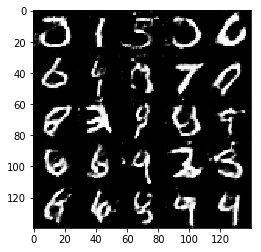

Epoch 1/2... Discriminator Loss: 1.0973... Generator Loss: 0.8353
Epoch 1/2... Discriminator Loss: 1.2456... Generator Loss: 0.5677
Epoch 1/2... Discriminator Loss: 0.9252... Generator Loss: 1.0337
Epoch 1/2... Discriminator Loss: 1.4440... Generator Loss: 2.7127
Epoch 1/2... Discriminator Loss: 1.0875... Generator Loss: 0.8374
Epoch 1/2... Discriminator Loss: 1.4451... Generator Loss: 0.5563
Epoch 1/2... Discriminator Loss: 0.7173... Generator Loss: 1.5378
Epoch 1/2... Discriminator Loss: 2.3007... Generator Loss: 0.2517
Epoch 1/2... Discriminator Loss: 0.8694... Generator Loss: 1.7217
Epoch 1/2... Discriminator Loss: 0.8390... Generator Loss: 1.1537


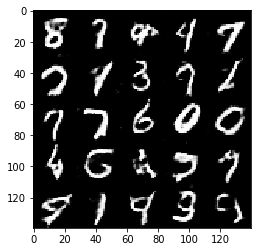

Epoch 1/2... Discriminator Loss: 1.4097... Generator Loss: 2.8217
Epoch 1/2... Discriminator Loss: 0.9408... Generator Loss: 0.9837
Epoch 1/2... Discriminator Loss: 0.7439... Generator Loss: 1.4476
Epoch 1/2... Discriminator Loss: 0.7154... Generator Loss: 1.4496
Epoch 1/2... Discriminator Loss: 1.0086... Generator Loss: 0.8481
Epoch 1/2... Discriminator Loss: 0.9538... Generator Loss: 1.8199
Epoch 1/2... Discriminator Loss: 0.8785... Generator Loss: 1.1464
Epoch 1/2... Discriminator Loss: 0.8334... Generator Loss: 1.4918
Epoch 1/2... Discriminator Loss: 0.7364... Generator Loss: 1.4621
Epoch 1/2... Discriminator Loss: 1.0981... Generator Loss: 1.6519


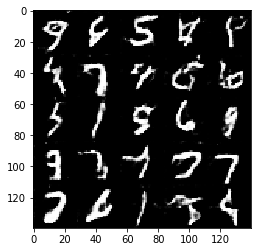

Epoch 1/2... Discriminator Loss: 1.5337... Generator Loss: 0.4921
Epoch 1/2... Discriminator Loss: 1.4719... Generator Loss: 2.9875
Epoch 1/2... Discriminator Loss: 0.7204... Generator Loss: 1.5861
Epoch 1/2... Discriminator Loss: 0.7558... Generator Loss: 1.4433
Epoch 1/2... Discriminator Loss: 0.7311... Generator Loss: 1.4191
Epoch 1/2... Discriminator Loss: 0.6998... Generator Loss: 1.6232
Epoch 1/2... Discriminator Loss: 0.8871... Generator Loss: 1.7241
Epoch 1/2... Discriminator Loss: 0.8587... Generator Loss: 1.2516
Epoch 1/2... Discriminator Loss: 0.8477... Generator Loss: 1.7171
Epoch 1/2... Discriminator Loss: 0.6502... Generator Loss: 1.5667


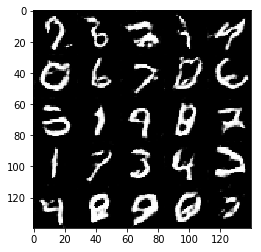

Epoch 1/2... Discriminator Loss: 0.8389... Generator Loss: 2.0577
Epoch 1/2... Discriminator Loss: 0.7921... Generator Loss: 1.3012
Epoch 1/2... Discriminator Loss: 0.7774... Generator Loss: 1.5605
Epoch 1/2... Discriminator Loss: 1.2123... Generator Loss: 0.6229
Epoch 1/2... Discriminator Loss: 0.8952... Generator Loss: 1.1127
Epoch 1/2... Discriminator Loss: 0.7902... Generator Loss: 1.2902
Epoch 1/2... Discriminator Loss: 0.8396... Generator Loss: 1.3675
Epoch 1/2... Discriminator Loss: 0.8582... Generator Loss: 1.0818
Epoch 1/2... Discriminator Loss: 0.8496... Generator Loss: 1.4778
Epoch 1/2... Discriminator Loss: 0.8334... Generator Loss: 1.6763


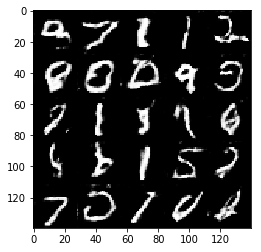

Epoch 1/2... Discriminator Loss: 0.8128... Generator Loss: 1.2803
Epoch 1/2... Discriminator Loss: 2.2370... Generator Loss: 0.2328
Epoch 1/2... Discriminator Loss: 1.3230... Generator Loss: 0.6181
Epoch 1/2... Discriminator Loss: 1.1004... Generator Loss: 2.5169
Epoch 1/2... Discriminator Loss: 0.7593... Generator Loss: 1.3001
Epoch 1/2... Discriminator Loss: 0.7787... Generator Loss: 1.1382
Epoch 1/2... Discriminator Loss: 2.3014... Generator Loss: 0.2832
Epoch 1/2... Discriminator Loss: 0.8220... Generator Loss: 2.1679
Epoch 1/2... Discriminator Loss: 0.8582... Generator Loss: 1.2027
Epoch 1/2... Discriminator Loss: 0.6585... Generator Loss: 1.6558


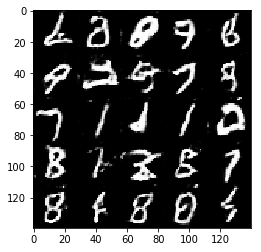

Epoch 1/2... Discriminator Loss: 1.4778... Generator Loss: 0.5083
Epoch 1/2... Discriminator Loss: 1.0351... Generator Loss: 1.0389
Epoch 1/2... Discriminator Loss: 0.8999... Generator Loss: 3.7139
Epoch 1/2... Discriminator Loss: 0.7322... Generator Loss: 1.3911
Epoch 1/2... Discriminator Loss: 0.9943... Generator Loss: 1.0836
Epoch 1/2... Discriminator Loss: 0.7509... Generator Loss: 2.3678
Epoch 1/2... Discriminator Loss: 0.6816... Generator Loss: 1.7542
Epoch 1/2... Discriminator Loss: 0.9900... Generator Loss: 0.8566
Epoch 1/2... Discriminator Loss: 0.6751... Generator Loss: 2.2294
Epoch 1/2... Discriminator Loss: 0.6820... Generator Loss: 1.9500


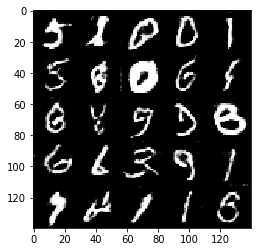

Epoch 1/2... Discriminator Loss: 1.3770... Generator Loss: 0.6508
Epoch 1/2... Discriminator Loss: 0.8919... Generator Loss: 1.0867
Epoch 1/2... Discriminator Loss: 0.6230... Generator Loss: 1.5881
Epoch 1/2... Discriminator Loss: 0.9849... Generator Loss: 0.9611
Epoch 1/2... Discriminator Loss: 0.7876... Generator Loss: 1.3388
Epoch 1/2... Discriminator Loss: 1.0841... Generator Loss: 0.9943
Epoch 1/2... Discriminator Loss: 0.7515... Generator Loss: 1.4099
Epoch 2/2... Discriminator Loss: 0.7599... Generator Loss: 1.5252
Epoch 2/2... Discriminator Loss: 1.5743... Generator Loss: 0.6258
Epoch 2/2... Discriminator Loss: 0.6568... Generator Loss: 1.5540


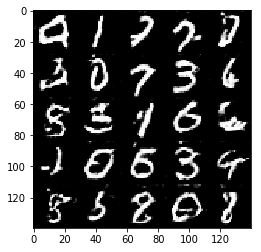

Epoch 2/2... Discriminator Loss: 1.8087... Generator Loss: 0.4451
Epoch 2/2... Discriminator Loss: 1.2492... Generator Loss: 0.6618
Epoch 2/2... Discriminator Loss: 0.8432... Generator Loss: 1.2607
Epoch 2/2... Discriminator Loss: 0.8498... Generator Loss: 1.7047
Epoch 2/2... Discriminator Loss: 0.5722... Generator Loss: 2.1205
Epoch 2/2... Discriminator Loss: 0.7320... Generator Loss: 1.5347
Epoch 2/2... Discriminator Loss: 0.6805... Generator Loss: 1.6217
Epoch 2/2... Discriminator Loss: 1.1856... Generator Loss: 0.9734
Epoch 2/2... Discriminator Loss: 1.0321... Generator Loss: 0.9612
Epoch 2/2... Discriminator Loss: 0.6884... Generator Loss: 2.6199


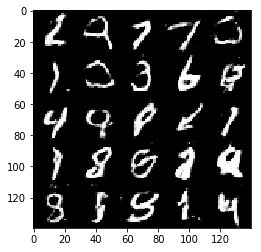

Epoch 2/2... Discriminator Loss: 1.3712... Generator Loss: 0.7255
Epoch 2/2... Discriminator Loss: 1.1917... Generator Loss: 0.8849
Epoch 2/2... Discriminator Loss: 0.7022... Generator Loss: 1.4896
Epoch 2/2... Discriminator Loss: 0.6402... Generator Loss: 1.8604
Epoch 2/2... Discriminator Loss: 0.7301... Generator Loss: 1.6371
Epoch 2/2... Discriminator Loss: 1.8438... Generator Loss: 0.5735
Epoch 2/2... Discriminator Loss: 0.9102... Generator Loss: 1.1162
Epoch 2/2... Discriminator Loss: 1.3215... Generator Loss: 0.7983
Epoch 2/2... Discriminator Loss: 0.5704... Generator Loss: 2.2326
Epoch 2/2... Discriminator Loss: 0.6424... Generator Loss: 1.8472


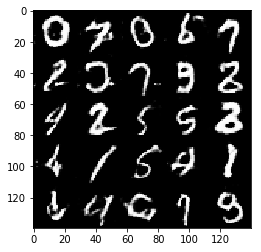

Epoch 2/2... Discriminator Loss: 0.7973... Generator Loss: 1.4850
Epoch 2/2... Discriminator Loss: 1.2457... Generator Loss: 0.8248
Epoch 2/2... Discriminator Loss: 0.6563... Generator Loss: 2.4404
Epoch 2/2... Discriminator Loss: 0.9583... Generator Loss: 1.1514
Epoch 2/2... Discriminator Loss: 0.7625... Generator Loss: 1.2536
Epoch 2/2... Discriminator Loss: 0.6355... Generator Loss: 2.0828
Epoch 2/2... Discriminator Loss: 0.8072... Generator Loss: 3.2164
Epoch 2/2... Discriminator Loss: 0.8652... Generator Loss: 1.8067
Epoch 2/2... Discriminator Loss: 1.0635... Generator Loss: 0.9105
Epoch 2/2... Discriminator Loss: 0.7548... Generator Loss: 1.7002


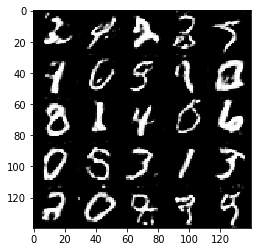

Epoch 2/2... Discriminator Loss: 0.7411... Generator Loss: 1.6266
Epoch 2/2... Discriminator Loss: 0.7971... Generator Loss: 2.9870
Epoch 2/2... Discriminator Loss: 0.8366... Generator Loss: 1.0964
Epoch 2/2... Discriminator Loss: 0.6946... Generator Loss: 2.0081
Epoch 2/2... Discriminator Loss: 0.8649... Generator Loss: 2.6480
Epoch 2/2... Discriminator Loss: 0.5419... Generator Loss: 2.3020
Epoch 2/2... Discriminator Loss: 0.6913... Generator Loss: 1.5953
Epoch 2/2... Discriminator Loss: 1.3764... Generator Loss: 0.7790
Epoch 2/2... Discriminator Loss: 1.0305... Generator Loss: 1.0101
Epoch 2/2... Discriminator Loss: 0.7434... Generator Loss: 1.2704


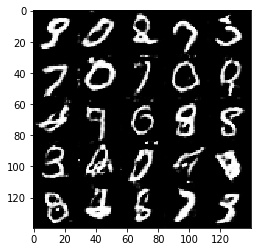

Epoch 2/2... Discriminator Loss: 0.5871... Generator Loss: 2.6009
Epoch 2/2... Discriminator Loss: 0.9231... Generator Loss: 1.1390
Epoch 2/2... Discriminator Loss: 0.5936... Generator Loss: 2.3515
Epoch 2/2... Discriminator Loss: 0.8775... Generator Loss: 2.8831
Epoch 2/2... Discriminator Loss: 0.6791... Generator Loss: 1.9275
Epoch 2/2... Discriminator Loss: 0.5375... Generator Loss: 2.4088
Epoch 2/2... Discriminator Loss: 0.8319... Generator Loss: 1.6921
Epoch 2/2... Discriminator Loss: 3.4765... Generator Loss: 6.0796
Epoch 2/2... Discriminator Loss: 0.8169... Generator Loss: 1.2969
Epoch 2/2... Discriminator Loss: 0.7243... Generator Loss: 1.7503


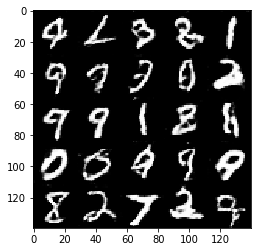

Epoch 2/2... Discriminator Loss: 0.8400... Generator Loss: 1.2818
Epoch 2/2... Discriminator Loss: 1.2102... Generator Loss: 0.7916
Epoch 2/2... Discriminator Loss: 0.6570... Generator Loss: 1.6413
Epoch 2/2... Discriminator Loss: 0.7659... Generator Loss: 1.4945
Epoch 2/2... Discriminator Loss: 0.6311... Generator Loss: 1.3306
Epoch 2/2... Discriminator Loss: 0.6261... Generator Loss: 2.2668
Epoch 2/2... Discriminator Loss: 0.7110... Generator Loss: 1.5801
Epoch 2/2... Discriminator Loss: 0.7475... Generator Loss: 1.4299
Epoch 2/2... Discriminator Loss: 0.6547... Generator Loss: 1.6934
Epoch 2/2... Discriminator Loss: 0.6907... Generator Loss: 1.6147


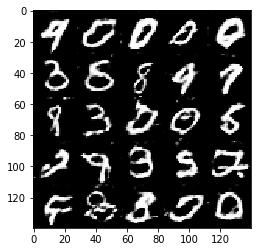

Epoch 2/2... Discriminator Loss: 0.6147... Generator Loss: 2.7836
Epoch 2/2... Discriminator Loss: 0.8719... Generator Loss: 1.1619
Epoch 2/2... Discriminator Loss: 0.8541... Generator Loss: 2.4803
Epoch 2/2... Discriminator Loss: 0.6462... Generator Loss: 1.5401
Epoch 2/2... Discriminator Loss: 1.2205... Generator Loss: 1.0155
Epoch 2/2... Discriminator Loss: 0.6134... Generator Loss: 1.9628
Epoch 2/2... Discriminator Loss: 2.5383... Generator Loss: 0.2291
Epoch 2/2... Discriminator Loss: 0.8895... Generator Loss: 1.1513
Epoch 2/2... Discriminator Loss: 0.5650... Generator Loss: 2.7556
Epoch 2/2... Discriminator Loss: 0.6995... Generator Loss: 1.8644


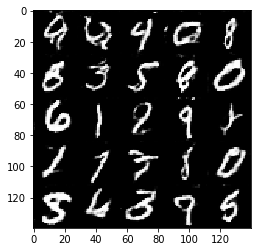

Epoch 2/2... Discriminator Loss: 0.6081... Generator Loss: 2.1967
Epoch 2/2... Discriminator Loss: 1.6988... Generator Loss: 0.5277
Epoch 2/2... Discriminator Loss: 0.7725... Generator Loss: 1.3794
Epoch 2/2... Discriminator Loss: 0.6818... Generator Loss: 1.6922
Epoch 2/2... Discriminator Loss: 0.5972... Generator Loss: 1.7790
Epoch 2/2... Discriminator Loss: 0.5613... Generator Loss: 2.2695
Epoch 2/2... Discriminator Loss: 1.0201... Generator Loss: 3.9590
Epoch 2/2... Discriminator Loss: 0.9990... Generator Loss: 1.1513
Epoch 2/2... Discriminator Loss: 0.5428... Generator Loss: 2.1575
Epoch 2/2... Discriminator Loss: 0.6015... Generator Loss: 2.4676


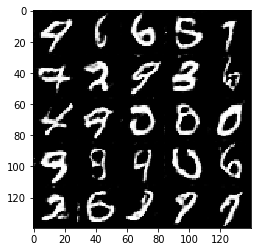

Epoch 2/2... Discriminator Loss: 0.5351... Generator Loss: 3.0991
Epoch 2/2... Discriminator Loss: 1.5218... Generator Loss: 0.4598
Epoch 2/2... Discriminator Loss: 0.5934... Generator Loss: 2.0502
Epoch 2/2... Discriminator Loss: 0.5232... Generator Loss: 2.0232
Epoch 2/2... Discriminator Loss: 0.4932... Generator Loss: 2.1696
Epoch 2/2... Discriminator Loss: 0.7508... Generator Loss: 1.7460
Epoch 2/2... Discriminator Loss: 0.5812... Generator Loss: 1.9233
Epoch 2/2... Discriminator Loss: 1.1093... Generator Loss: 3.4270
Epoch 2/2... Discriminator Loss: 0.5976... Generator Loss: 1.9323
Epoch 2/2... Discriminator Loss: 0.6154... Generator Loss: 1.7033


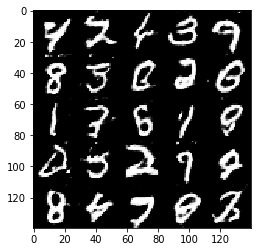

Epoch 2/2... Discriminator Loss: 0.9551... Generator Loss: 2.8886
Epoch 2/2... Discriminator Loss: 0.7216... Generator Loss: 2.6270
Epoch 2/2... Discriminator Loss: 0.6726... Generator Loss: 1.7107
Epoch 2/2... Discriminator Loss: 0.4666... Generator Loss: 2.6787
Epoch 2/2... Discriminator Loss: 0.6153... Generator Loss: 1.6767
Epoch 2/2... Discriminator Loss: 0.5198... Generator Loss: 2.1764
Epoch 2/2... Discriminator Loss: 0.5464... Generator Loss: 2.1518
Epoch 2/2... Discriminator Loss: 0.4910... Generator Loss: 2.5310
Epoch 2/2... Discriminator Loss: 0.7236... Generator Loss: 1.4124
Epoch 2/2... Discriminator Loss: 0.5570... Generator Loss: 2.6527


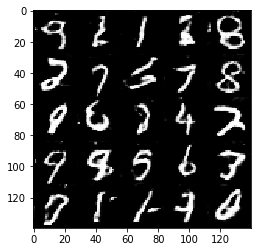

Epoch 2/2... Discriminator Loss: 2.4331... Generator Loss: 5.8802
Epoch 2/2... Discriminator Loss: 0.4705... Generator Loss: 2.8395
Epoch 2/2... Discriminator Loss: 0.6346... Generator Loss: 2.2957
Epoch 2/2... Discriminator Loss: 0.6226... Generator Loss: 1.9677
Epoch 2/2... Discriminator Loss: 0.7509... Generator Loss: 2.8700
Epoch 2/2... Discriminator Loss: 0.7717... Generator Loss: 1.3991
Epoch 2/2... Discriminator Loss: 0.5431... Generator Loss: 2.2808
Epoch 2/2... Discriminator Loss: 0.5216... Generator Loss: 2.4117
Epoch 2/2... Discriminator Loss: 0.6360... Generator Loss: 1.7342
Epoch 2/2... Discriminator Loss: 0.6898... Generator Loss: 1.4542


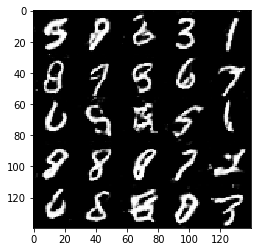

Epoch 2/2... Discriminator Loss: 1.9057... Generator Loss: 0.4034
Epoch 2/2... Discriminator Loss: 0.6870... Generator Loss: 1.4260
Epoch 2/2... Discriminator Loss: 0.5777... Generator Loss: 2.0974
Epoch 2/2... Discriminator Loss: 1.0332... Generator Loss: 2.7425
Epoch 2/2... Discriminator Loss: 1.1231... Generator Loss: 0.8896
Epoch 2/2... Discriminator Loss: 1.1202... Generator Loss: 1.2422
Epoch 2/2... Discriminator Loss: 0.5606... Generator Loss: 2.4963
Epoch 2/2... Discriminator Loss: 0.4785... Generator Loss: 2.6246
Epoch 2/2... Discriminator Loss: 1.0468... Generator Loss: 4.2352
Epoch 2/2... Discriminator Loss: 0.8008... Generator Loss: 1.1989


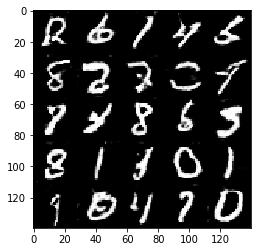

Epoch 2/2... Discriminator Loss: 1.3001... Generator Loss: 1.0722
Epoch 2/2... Discriminator Loss: 0.7597... Generator Loss: 1.8057
Epoch 2/2... Discriminator Loss: 0.6642... Generator Loss: 1.5652
Epoch 2/2... Discriminator Loss: 0.5569... Generator Loss: 1.9822
Epoch 2/2... Discriminator Loss: 0.5214... Generator Loss: 2.3512
Epoch 2/2... Discriminator Loss: 0.5726... Generator Loss: 2.2648
Epoch 2/2... Discriminator Loss: 0.8010... Generator Loss: 1.2528
Epoch 2/2... Discriminator Loss: 0.5765... Generator Loss: 1.6278
Epoch 2/2... Discriminator Loss: 0.5621... Generator Loss: 2.2821
Epoch 2/2... Discriminator Loss: 1.9624... Generator Loss: 0.5118


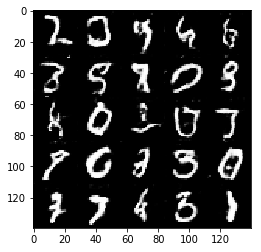

Epoch 2/2... Discriminator Loss: 0.6653... Generator Loss: 1.4782
Epoch 2/2... Discriminator Loss: 0.6937... Generator Loss: 2.5725
Epoch 2/2... Discriminator Loss: 0.6052... Generator Loss: 2.3160
Epoch 2/2... Discriminator Loss: 0.8732... Generator Loss: 1.1180
Epoch 2/2... Discriminator Loss: 0.6463... Generator Loss: 2.7243
Epoch 2/2... Discriminator Loss: 0.7013... Generator Loss: 2.6255
Epoch 2/2... Discriminator Loss: 0.6280... Generator Loss: 1.5152
Epoch 2/2... Discriminator Loss: 0.5593... Generator Loss: 2.2527
Epoch 2/2... Discriminator Loss: 0.6404... Generator Loss: 2.0907
Epoch 2/2... Discriminator Loss: 0.9558... Generator Loss: 1.0400


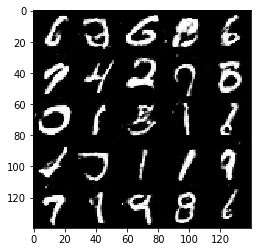

Epoch 2/2... Discriminator Loss: 0.4880... Generator Loss: 2.7193
Epoch 2/2... Discriminator Loss: 0.5147... Generator Loss: 2.3831
Epoch 2/2... Discriminator Loss: 0.7646... Generator Loss: 1.4971
Epoch 2/2... Discriminator Loss: 0.7669... Generator Loss: 1.5698
Epoch 2/2... Discriminator Loss: 0.5074... Generator Loss: 2.3219
Epoch 2/2... Discriminator Loss: 0.8270... Generator Loss: 1.5132
Epoch 2/2... Discriminator Loss: 0.5977... Generator Loss: 3.0878
Epoch 2/2... Discriminator Loss: 0.5597... Generator Loss: 2.1686
Epoch 2/2... Discriminator Loss: 0.6144... Generator Loss: 2.2255
Epoch 2/2... Discriminator Loss: 0.4745... Generator Loss: 2.6730


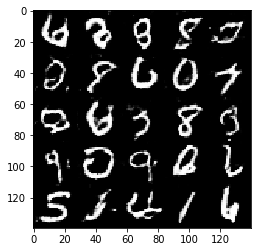

Epoch 2/2... Discriminator Loss: 1.7893... Generator Loss: 0.6175
Epoch 2/2... Discriminator Loss: 1.0460... Generator Loss: 0.9404
Epoch 2/2... Discriminator Loss: 0.8963... Generator Loss: 1.4781
Epoch 2/2... Discriminator Loss: 0.6141... Generator Loss: 1.8446
Epoch 2/2... Discriminator Loss: 0.5513... Generator Loss: 2.3266
Epoch 2/2... Discriminator Loss: 0.6224... Generator Loss: 2.2745
Epoch 2/2... Discriminator Loss: 0.4751... Generator Loss: 2.7122
Epoch 2/2... Discriminator Loss: 0.4726... Generator Loss: 2.4101
Epoch 2/2... Discriminator Loss: 0.5767... Generator Loss: 2.7118
Epoch 2/2... Discriminator Loss: 0.5450... Generator Loss: 2.2574


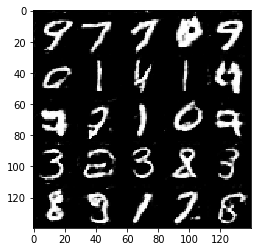

Epoch 2/2... Discriminator Loss: 0.4946... Generator Loss: 2.3990
Epoch 2/2... Discriminator Loss: 0.5849... Generator Loss: 2.2402
Epoch 2/2... Discriminator Loss: 0.5197... Generator Loss: 2.4280
Epoch 2/2... Discriminator Loss: 0.6949... Generator Loss: 3.2620
Epoch 2/2... Discriminator Loss: 0.6938... Generator Loss: 2.8444
Epoch 2/2... Discriminator Loss: 0.5165... Generator Loss: 2.5294
Epoch 2/2... Discriminator Loss: 0.4499... Generator Loss: 2.8425
Epoch 2/2... Discriminator Loss: 0.4763... Generator Loss: 2.7931
Epoch 2/2... Discriminator Loss: 0.6402... Generator Loss: 1.9331
Epoch 2/2... Discriminator Loss: 0.5114... Generator Loss: 2.0514


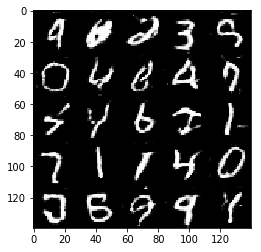

Epoch 2/2... Discriminator Loss: 1.1335... Generator Loss: 0.8633
Epoch 2/2... Discriminator Loss: 1.5648... Generator Loss: 4.2953
Epoch 2/2... Discriminator Loss: 1.9129... Generator Loss: 0.3725
Epoch 2/2... Discriminator Loss: 1.1178... Generator Loss: 1.0901
Epoch 2/2... Discriminator Loss: 0.4775... Generator Loss: 2.4089
Epoch 2/2... Discriminator Loss: 0.5087... Generator Loss: 2.6758
Epoch 2/2... Discriminator Loss: 0.5892... Generator Loss: 2.0141
Epoch 2/2... Discriminator Loss: 0.5080... Generator Loss: 2.4639
Epoch 2/2... Discriminator Loss: 0.6660... Generator Loss: 1.9001
Epoch 2/2... Discriminator Loss: 0.7680... Generator Loss: 1.2575


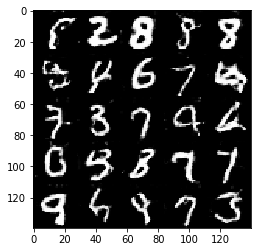

Epoch 2/2... Discriminator Loss: 0.5248... Generator Loss: 2.7852
Epoch 2/2... Discriminator Loss: 0.8518... Generator Loss: 3.6998
Epoch 2/2... Discriminator Loss: 0.7862... Generator Loss: 1.5110
Epoch 2/2... Discriminator Loss: 0.7404... Generator Loss: 1.3050
Epoch 2/2... Discriminator Loss: 1.2591... Generator Loss: 0.9128


In [22]:
batch_size = 32
z_dim = 100
learning_rate = 0.00035
beta1 = 0.21


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/1... Discriminator Loss: 2.7338... Generator Loss: 0.2687
Epoch 1/1... Discriminator Loss: 0.7459... Generator Loss: 4.9140
Epoch 1/1... Discriminator Loss: 0.8387... Generator Loss: 2.0193
Epoch 1/1... Discriminator Loss: 1.2465... Generator Loss: 5.0287
Epoch 1/1... Discriminator Loss: 0.5992... Generator Loss: 3.1118
Epoch 1/1... Discriminator Loss: 1.2782... Generator Loss: 0.9736
Epoch 1/1... Discriminator Loss: 0.5348... Generator Loss: 2.2602
Epoch 1/1... Discriminator Loss: 0.7253... Generator Loss: 6.0491
Epoch 1/1... Discriminator Loss: 0.5477... Generator Loss: 2.3786
Epoch 1/1... Discriminator Loss: 0.4196... Generator Loss: 4.5096


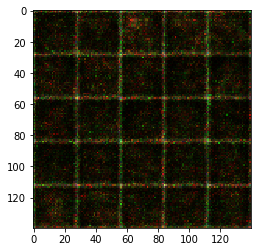

Epoch 1/1... Discriminator Loss: 0.7467... Generator Loss: 1.7802
Epoch 1/1... Discriminator Loss: 2.4618... Generator Loss: 6.7506
Epoch 1/1... Discriminator Loss: 0.5330... Generator Loss: 2.1730
Epoch 1/1... Discriminator Loss: 1.3770... Generator Loss: 0.5993
Epoch 1/1... Discriminator Loss: 0.9223... Generator Loss: 0.8584
Epoch 1/1... Discriminator Loss: 0.4874... Generator Loss: 3.6171
Epoch 1/1... Discriminator Loss: 1.2586... Generator Loss: 0.9203
Epoch 1/1... Discriminator Loss: 1.3517... Generator Loss: 0.6727
Epoch 1/1... Discriminator Loss: 0.9572... Generator Loss: 1.1803
Epoch 1/1... Discriminator Loss: 1.1934... Generator Loss: 1.0304


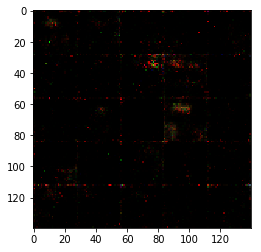

Epoch 1/1... Discriminator Loss: 2.2478... Generator Loss: 4.6928
Epoch 1/1... Discriminator Loss: 1.6575... Generator Loss: 0.5601
Epoch 1/1... Discriminator Loss: 1.0178... Generator Loss: 1.0305
Epoch 1/1... Discriminator Loss: 2.5901... Generator Loss: 0.2282
Epoch 1/1... Discriminator Loss: 2.7270... Generator Loss: 4.5308
Epoch 1/1... Discriminator Loss: 1.4089... Generator Loss: 0.6799
Epoch 1/1... Discriminator Loss: 0.5945... Generator Loss: 2.0610
Epoch 1/1... Discriminator Loss: 3.7360... Generator Loss: 0.0677
Epoch 1/1... Discriminator Loss: 1.0249... Generator Loss: 2.9453
Epoch 1/1... Discriminator Loss: 0.7791... Generator Loss: 1.7423


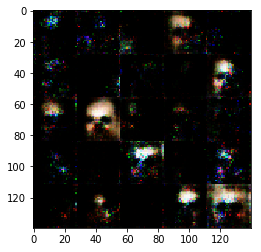

Epoch 1/1... Discriminator Loss: 0.7038... Generator Loss: 1.6185
Epoch 1/1... Discriminator Loss: 1.2774... Generator Loss: 1.1922
Epoch 1/1... Discriminator Loss: 0.8852... Generator Loss: 1.3812
Epoch 1/1... Discriminator Loss: 0.7547... Generator Loss: 1.2313
Epoch 1/1... Discriminator Loss: 1.0569... Generator Loss: 1.0458
Epoch 1/1... Discriminator Loss: 2.0613... Generator Loss: 3.6534
Epoch 1/1... Discriminator Loss: 1.0775... Generator Loss: 0.8879
Epoch 1/1... Discriminator Loss: 1.1535... Generator Loss: 2.8470
Epoch 1/1... Discriminator Loss: 0.8814... Generator Loss: 1.6306
Epoch 1/1... Discriminator Loss: 1.0529... Generator Loss: 2.1100


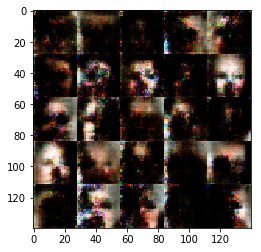

Epoch 1/1... Discriminator Loss: 0.8989... Generator Loss: 1.4787
Epoch 1/1... Discriminator Loss: 1.2737... Generator Loss: 2.9352
Epoch 1/1... Discriminator Loss: 0.8737... Generator Loss: 1.5636
Epoch 1/1... Discriminator Loss: 1.7338... Generator Loss: 0.5411
Epoch 1/1... Discriminator Loss: 1.1601... Generator Loss: 0.8678
Epoch 1/1... Discriminator Loss: 1.3342... Generator Loss: 0.5380
Epoch 1/1... Discriminator Loss: 1.4367... Generator Loss: 0.5902
Epoch 1/1... Discriminator Loss: 1.4850... Generator Loss: 0.4913
Epoch 1/1... Discriminator Loss: 1.4129... Generator Loss: 0.4814
Epoch 1/1... Discriminator Loss: 1.7330... Generator Loss: 2.3936


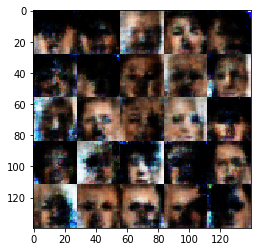

Epoch 1/1... Discriminator Loss: 0.9168... Generator Loss: 2.0149
Epoch 1/1... Discriminator Loss: 0.9784... Generator Loss: 2.2727
Epoch 1/1... Discriminator Loss: 0.9541... Generator Loss: 1.0912
Epoch 1/1... Discriminator Loss: 1.3166... Generator Loss: 0.5644
Epoch 1/1... Discriminator Loss: 1.0024... Generator Loss: 0.9532
Epoch 1/1... Discriminator Loss: 1.1487... Generator Loss: 1.3154
Epoch 1/1... Discriminator Loss: 1.4776... Generator Loss: 0.4263
Epoch 1/1... Discriminator Loss: 1.3422... Generator Loss: 0.6559
Epoch 1/1... Discriminator Loss: 1.5314... Generator Loss: 0.5272
Epoch 1/1... Discriminator Loss: 1.2714... Generator Loss: 0.7336


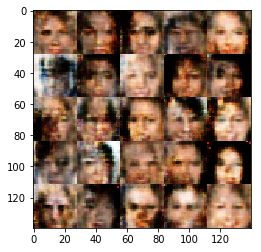

Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 1.9775
Epoch 1/1... Discriminator Loss: 1.2895... Generator Loss: 1.0029
Epoch 1/1... Discriminator Loss: 1.2493... Generator Loss: 0.5691
Epoch 1/1... Discriminator Loss: 1.3042... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.3123... Generator Loss: 0.6304
Epoch 1/1... Discriminator Loss: 1.2258... Generator Loss: 0.6286
Epoch 1/1... Discriminator Loss: 1.3381... Generator Loss: 0.5233
Epoch 1/1... Discriminator Loss: 1.2710... Generator Loss: 0.6031
Epoch 1/1... Discriminator Loss: 1.1656... Generator Loss: 1.5064
Epoch 1/1... Discriminator Loss: 1.3348... Generator Loss: 0.7217


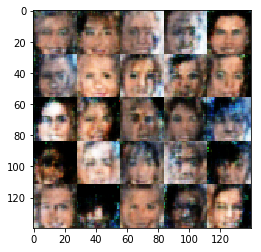

Epoch 1/1... Discriminator Loss: 2.4084... Generator Loss: 0.1974
Epoch 1/1... Discriminator Loss: 1.0933... Generator Loss: 0.6746
Epoch 1/1... Discriminator Loss: 1.2613... Generator Loss: 0.5770
Epoch 1/1... Discriminator Loss: 1.5471... Generator Loss: 0.4635
Epoch 1/1... Discriminator Loss: 1.4532... Generator Loss: 1.9436
Epoch 1/1... Discriminator Loss: 1.2877... Generator Loss: 0.9270
Epoch 1/1... Discriminator Loss: 1.5709... Generator Loss: 1.5184
Epoch 1/1... Discriminator Loss: 1.2899... Generator Loss: 0.6949
Epoch 1/1... Discriminator Loss: 1.8971... Generator Loss: 0.2549
Epoch 1/1... Discriminator Loss: 1.3505... Generator Loss: 1.4145


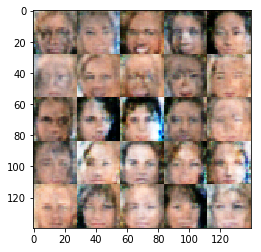

Epoch 1/1... Discriminator Loss: 1.1483... Generator Loss: 0.9263
Epoch 1/1... Discriminator Loss: 1.2925... Generator Loss: 0.5793
Epoch 1/1... Discriminator Loss: 1.6281... Generator Loss: 0.4761
Epoch 1/1... Discriminator Loss: 1.2486... Generator Loss: 1.3992
Epoch 1/1... Discriminator Loss: 1.2932... Generator Loss: 0.8218
Epoch 1/1... Discriminator Loss: 1.1818... Generator Loss: 0.7174
Epoch 1/1... Discriminator Loss: 1.3136... Generator Loss: 0.6021
Epoch 1/1... Discriminator Loss: 1.3738... Generator Loss: 0.5737
Epoch 1/1... Discriminator Loss: 1.3408... Generator Loss: 1.5257
Epoch 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.8460


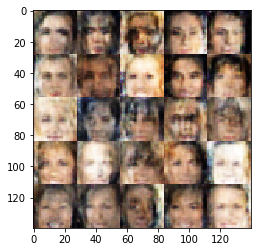

Epoch 1/1... Discriminator Loss: 1.7541... Generator Loss: 0.3402
Epoch 1/1... Discriminator Loss: 1.2763... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.3808... Generator Loss: 0.4860
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.6318
Epoch 1/1... Discriminator Loss: 1.4806... Generator Loss: 0.4451
Epoch 1/1... Discriminator Loss: 1.1163... Generator Loss: 0.8651
Epoch 1/1... Discriminator Loss: 1.3033... Generator Loss: 0.6012
Epoch 1/1... Discriminator Loss: 1.2294... Generator Loss: 0.7664
Epoch 1/1... Discriminator Loss: 1.7283... Generator Loss: 0.3994
Epoch 1/1... Discriminator Loss: 1.5886... Generator Loss: 0.4323


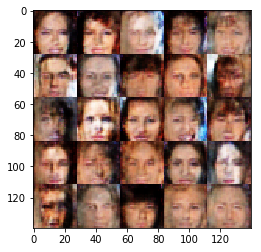

Epoch 1/1... Discriminator Loss: 1.3171... Generator Loss: 0.5070
Epoch 1/1... Discriminator Loss: 1.2378... Generator Loss: 0.6581
Epoch 1/1... Discriminator Loss: 1.3184... Generator Loss: 0.5397
Epoch 1/1... Discriminator Loss: 1.3122... Generator Loss: 0.7242
Epoch 1/1... Discriminator Loss: 1.3317... Generator Loss: 0.5852
Epoch 1/1... Discriminator Loss: 1.2402... Generator Loss: 0.8060
Epoch 1/1... Discriminator Loss: 1.2502... Generator Loss: 0.7431
Epoch 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.8159
Epoch 1/1... Discriminator Loss: 1.2730... Generator Loss: 0.9566
Epoch 1/1... Discriminator Loss: 1.0883... Generator Loss: 0.9795


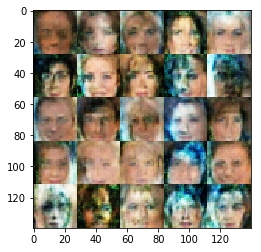

Epoch 1/1... Discriminator Loss: 1.1635... Generator Loss: 1.0431
Epoch 1/1... Discriminator Loss: 1.1711... Generator Loss: 0.7671
Epoch 1/1... Discriminator Loss: 1.2795... Generator Loss: 0.7376
Epoch 1/1... Discriminator Loss: 1.4319... Generator Loss: 0.5796
Epoch 1/1... Discriminator Loss: 1.1199... Generator Loss: 0.9029
Epoch 1/1... Discriminator Loss: 1.3117... Generator Loss: 0.6268
Epoch 1/1... Discriminator Loss: 1.3016... Generator Loss: 0.5963
Epoch 1/1... Discriminator Loss: 1.2799... Generator Loss: 0.7087
Epoch 1/1... Discriminator Loss: 1.2192... Generator Loss: 0.5976
Epoch 1/1... Discriminator Loss: 1.1557... Generator Loss: 0.8920


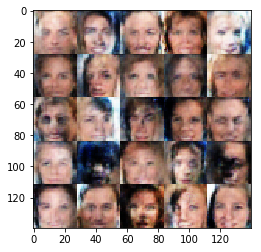

Epoch 1/1... Discriminator Loss: 1.4567... Generator Loss: 0.4841
Epoch 1/1... Discriminator Loss: 1.1223... Generator Loss: 1.1440
Epoch 1/1... Discriminator Loss: 1.4403... Generator Loss: 0.4956
Epoch 1/1... Discriminator Loss: 1.2008... Generator Loss: 0.7340
Epoch 1/1... Discriminator Loss: 1.2041... Generator Loss: 0.7533
Epoch 1/1... Discriminator Loss: 1.1937... Generator Loss: 0.7463
Epoch 1/1... Discriminator Loss: 1.3841... Generator Loss: 0.5813
Epoch 1/1... Discriminator Loss: 1.1948... Generator Loss: 1.2724
Epoch 1/1... Discriminator Loss: 1.2972... Generator Loss: 0.8908
Epoch 1/1... Discriminator Loss: 1.4967... Generator Loss: 0.4263


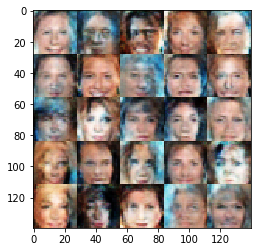

Epoch 1/1... Discriminator Loss: 1.3580... Generator Loss: 0.6831
Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.6789
Epoch 1/1... Discriminator Loss: 1.6677... Generator Loss: 0.3712
Epoch 1/1... Discriminator Loss: 1.2981... Generator Loss: 0.5987
Epoch 1/1... Discriminator Loss: 1.2236... Generator Loss: 1.0499
Epoch 1/1... Discriminator Loss: 1.2759... Generator Loss: 0.5572
Epoch 1/1... Discriminator Loss: 1.1981... Generator Loss: 0.7470
Epoch 1/1... Discriminator Loss: 1.3103... Generator Loss: 0.8275
Epoch 1/1... Discriminator Loss: 1.6108... Generator Loss: 0.4036
Epoch 1/1... Discriminator Loss: 1.2918... Generator Loss: 0.6737


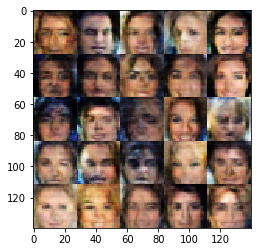

Epoch 1/1... Discriminator Loss: 1.2641... Generator Loss: 0.6395
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 0.9471
Epoch 1/1... Discriminator Loss: 1.6337... Generator Loss: 0.4273
Epoch 1/1... Discriminator Loss: 1.1769... Generator Loss: 0.8839
Epoch 1/1... Discriminator Loss: 1.4896... Generator Loss: 0.4968
Epoch 1/1... Discriminator Loss: 1.2045... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.1389... Generator Loss: 0.8372
Epoch 1/1... Discriminator Loss: 1.1982... Generator Loss: 0.6874
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.5684
Epoch 1/1... Discriminator Loss: 1.2707... Generator Loss: 0.6362


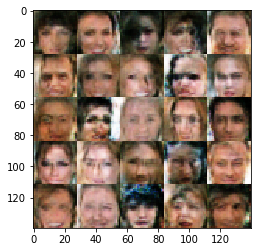

Epoch 1/1... Discriminator Loss: 1.0955... Generator Loss: 0.8419
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 0.7111
Epoch 1/1... Discriminator Loss: 1.3766... Generator Loss: 0.6053
Epoch 1/1... Discriminator Loss: 1.4396... Generator Loss: 0.4933
Epoch 1/1... Discriminator Loss: 1.2527... Generator Loss: 1.9336
Epoch 1/1... Discriminator Loss: 1.4920... Generator Loss: 0.4500
Epoch 1/1... Discriminator Loss: 1.3187... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 1.3497... Generator Loss: 0.5787
Epoch 1/1... Discriminator Loss: 1.0731... Generator Loss: 1.0946
Epoch 1/1... Discriminator Loss: 1.4643... Generator Loss: 0.5530


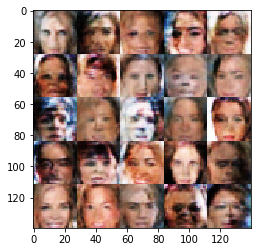

Epoch 1/1... Discriminator Loss: 1.4397... Generator Loss: 0.4743
Epoch 1/1... Discriminator Loss: 1.1419... Generator Loss: 0.7810
Epoch 1/1... Discriminator Loss: 1.2177... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.2888... Generator Loss: 0.6169
Epoch 1/1... Discriminator Loss: 1.4204... Generator Loss: 0.5142
Epoch 1/1... Discriminator Loss: 1.5586... Generator Loss: 0.3584
Epoch 1/1... Discriminator Loss: 1.2619... Generator Loss: 1.3166
Epoch 1/1... Discriminator Loss: 1.2069... Generator Loss: 0.6939
Epoch 1/1... Discriminator Loss: 1.1751... Generator Loss: 0.5967
Epoch 1/1... Discriminator Loss: 1.1806... Generator Loss: 0.8332


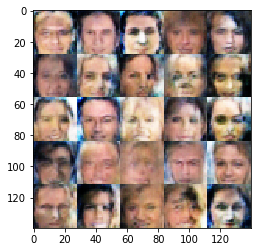

Epoch 1/1... Discriminator Loss: 1.0048... Generator Loss: 1.0046
Epoch 1/1... Discriminator Loss: 1.0791... Generator Loss: 0.9447
Epoch 1/1... Discriminator Loss: 1.4080... Generator Loss: 0.6361
Epoch 1/1... Discriminator Loss: 1.2960... Generator Loss: 0.5351
Epoch 1/1... Discriminator Loss: 1.2143... Generator Loss: 1.4751
Epoch 1/1... Discriminator Loss: 1.2483... Generator Loss: 0.6716
Epoch 1/1... Discriminator Loss: 1.1772... Generator Loss: 0.9242
Epoch 1/1... Discriminator Loss: 1.1359... Generator Loss: 0.8085
Epoch 1/1... Discriminator Loss: 1.1091... Generator Loss: 1.0022
Epoch 1/1... Discriminator Loss: 1.5543... Generator Loss: 0.4686


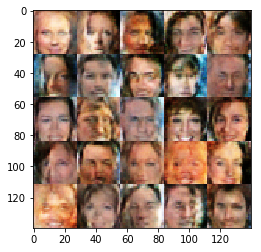

Epoch 1/1... Discriminator Loss: 1.1196... Generator Loss: 1.0504
Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.5521
Epoch 1/1... Discriminator Loss: 1.2390... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.2187... Generator Loss: 0.7010
Epoch 1/1... Discriminator Loss: 1.1274... Generator Loss: 0.8063
Epoch 1/1... Discriminator Loss: 1.6688... Generator Loss: 0.3864
Epoch 1/1... Discriminator Loss: 1.3675... Generator Loss: 1.4266
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.9488
Epoch 1/1... Discriminator Loss: 1.1121... Generator Loss: 0.9378
Epoch 1/1... Discriminator Loss: 1.1540... Generator Loss: 0.6750


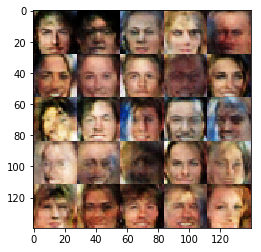

Epoch 1/1... Discriminator Loss: 1.4219... Generator Loss: 0.5369
Epoch 1/1... Discriminator Loss: 1.1322... Generator Loss: 1.1185
Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 1.3578
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.5583
Epoch 1/1... Discriminator Loss: 1.2234... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.4536... Generator Loss: 0.6092
Epoch 1/1... Discriminator Loss: 1.2813... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.5679... Generator Loss: 0.3719
Epoch 1/1... Discriminator Loss: 1.3522... Generator Loss: 0.5530
Epoch 1/1... Discriminator Loss: 1.1961... Generator Loss: 1.0055


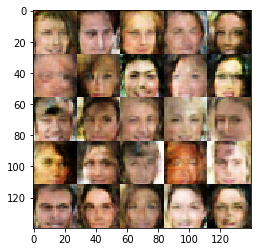

Epoch 1/1... Discriminator Loss: 1.3149... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.2915... Generator Loss: 0.6047
Epoch 1/1... Discriminator Loss: 1.3528... Generator Loss: 0.5375
Epoch 1/1... Discriminator Loss: 1.5945... Generator Loss: 0.3815
Epoch 1/1... Discriminator Loss: 1.2882... Generator Loss: 0.6855
Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.4625
Epoch 1/1... Discriminator Loss: 1.0778... Generator Loss: 0.9301
Epoch 1/1... Discriminator Loss: 1.6293... Generator Loss: 0.4169
Epoch 1/1... Discriminator Loss: 1.2209... Generator Loss: 0.7717
Epoch 1/1... Discriminator Loss: 1.2266... Generator Loss: 0.6508


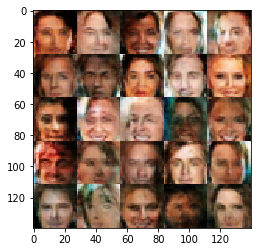

Epoch 1/1... Discriminator Loss: 1.2701... Generator Loss: 0.5608
Epoch 1/1... Discriminator Loss: 1.1458... Generator Loss: 0.9804
Epoch 1/1... Discriminator Loss: 1.2833... Generator Loss: 0.6064
Epoch 1/1... Discriminator Loss: 1.1282... Generator Loss: 0.9589
Epoch 1/1... Discriminator Loss: 1.3263... Generator Loss: 0.6570
Epoch 1/1... Discriminator Loss: 1.1070... Generator Loss: 0.8806
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 1.2497
Epoch 1/1... Discriminator Loss: 1.2278... Generator Loss: 0.7081
Epoch 1/1... Discriminator Loss: 1.4622... Generator Loss: 0.4822
Epoch 1/1... Discriminator Loss: 1.3951... Generator Loss: 0.6681


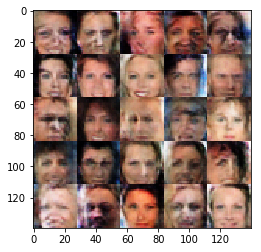

Epoch 1/1... Discriminator Loss: 1.1056... Generator Loss: 1.2473
Epoch 1/1... Discriminator Loss: 1.1674... Generator Loss: 0.9257
Epoch 1/1... Discriminator Loss: 1.1862... Generator Loss: 0.9547
Epoch 1/1... Discriminator Loss: 1.3546... Generator Loss: 0.5361
Epoch 1/1... Discriminator Loss: 1.4584... Generator Loss: 0.5060
Epoch 1/1... Discriminator Loss: 1.4254... Generator Loss: 0.5383
Epoch 1/1... Discriminator Loss: 1.1651... Generator Loss: 0.8478
Epoch 1/1... Discriminator Loss: 1.4068... Generator Loss: 0.5609
Epoch 1/1... Discriminator Loss: 1.9629... Generator Loss: 0.2648
Epoch 1/1... Discriminator Loss: 1.1985... Generator Loss: 1.0161


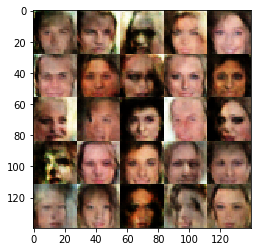

Epoch 1/1... Discriminator Loss: 1.2965... Generator Loss: 0.6986
Epoch 1/1... Discriminator Loss: 1.2252... Generator Loss: 0.7269
Epoch 1/1... Discriminator Loss: 1.2241... Generator Loss: 0.5736
Epoch 1/1... Discriminator Loss: 0.9929... Generator Loss: 1.0192
Epoch 1/1... Discriminator Loss: 1.1513... Generator Loss: 0.7137
Epoch 1/1... Discriminator Loss: 1.2267... Generator Loss: 0.9113
Epoch 1/1... Discriminator Loss: 1.3556... Generator Loss: 0.5477
Epoch 1/1... Discriminator Loss: 1.2289... Generator Loss: 0.6389
Epoch 1/1... Discriminator Loss: 1.6395... Generator Loss: 0.3770
Epoch 1/1... Discriminator Loss: 1.0430... Generator Loss: 1.1305


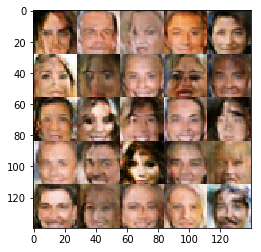

Epoch 1/1... Discriminator Loss: 1.3914... Generator Loss: 0.5146
Epoch 1/1... Discriminator Loss: 1.2228... Generator Loss: 0.6966
Epoch 1/1... Discriminator Loss: 1.1951... Generator Loss: 0.6620
Epoch 1/1... Discriminator Loss: 1.3288... Generator Loss: 1.5045
Epoch 1/1... Discriminator Loss: 1.3839... Generator Loss: 0.6348
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.7410
Epoch 1/1... Discriminator Loss: 1.1433... Generator Loss: 0.8943
Epoch 1/1... Discriminator Loss: 1.2902... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.3115... Generator Loss: 0.6197
Epoch 1/1... Discriminator Loss: 1.4210... Generator Loss: 0.5045


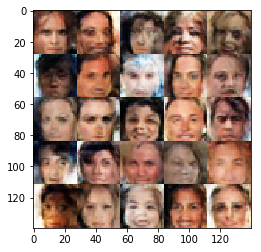

Epoch 1/1... Discriminator Loss: 1.4701... Generator Loss: 0.4884
Epoch 1/1... Discriminator Loss: 1.4543... Generator Loss: 0.5214
Epoch 1/1... Discriminator Loss: 1.1666... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.5274... Generator Loss: 0.4321
Epoch 1/1... Discriminator Loss: 1.1726... Generator Loss: 0.9062
Epoch 1/1... Discriminator Loss: 1.4626... Generator Loss: 0.4662
Epoch 1/1... Discriminator Loss: 1.6003... Generator Loss: 0.3636
Epoch 1/1... Discriminator Loss: 1.2383... Generator Loss: 0.6851
Epoch 1/1... Discriminator Loss: 1.0228... Generator Loss: 1.0145
Epoch 1/1... Discriminator Loss: 1.6810... Generator Loss: 0.3675


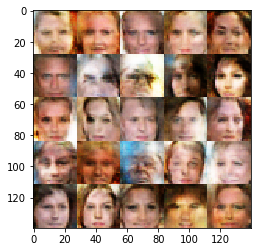

Epoch 1/1... Discriminator Loss: 1.2043... Generator Loss: 0.9728
Epoch 1/1... Discriminator Loss: 1.1561... Generator Loss: 0.8270
Epoch 1/1... Discriminator Loss: 1.6080... Generator Loss: 0.3905
Epoch 1/1... Discriminator Loss: 1.1211... Generator Loss: 0.7638
Epoch 1/1... Discriminator Loss: 1.2408... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.4762... Generator Loss: 0.4616
Epoch 1/1... Discriminator Loss: 1.0907... Generator Loss: 0.8404
Epoch 1/1... Discriminator Loss: 1.2490... Generator Loss: 1.0478
Epoch 1/1... Discriminator Loss: 1.2679... Generator Loss: 0.5826
Epoch 1/1... Discriminator Loss: 1.3765... Generator Loss: 0.8867


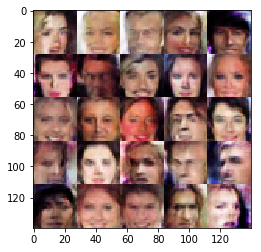

Epoch 1/1... Discriminator Loss: 1.2869... Generator Loss: 0.5693
Epoch 1/1... Discriminator Loss: 1.5166... Generator Loss: 0.3941
Epoch 1/1... Discriminator Loss: 1.1837... Generator Loss: 0.8440
Epoch 1/1... Discriminator Loss: 1.5010... Generator Loss: 0.4833
Epoch 1/1... Discriminator Loss: 1.5036... Generator Loss: 0.4937
Epoch 1/1... Discriminator Loss: 0.9578... Generator Loss: 1.4192
Epoch 1/1... Discriminator Loss: 1.1673... Generator Loss: 0.8604
Epoch 1/1... Discriminator Loss: 1.1383... Generator Loss: 1.3085
Epoch 1/1... Discriminator Loss: 1.1353... Generator Loss: 0.9684
Epoch 1/1... Discriminator Loss: 1.2889... Generator Loss: 1.4961


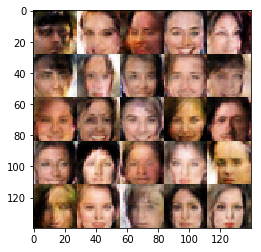

Epoch 1/1... Discriminator Loss: 1.2207... Generator Loss: 0.6191
Epoch 1/1... Discriminator Loss: 1.1802... Generator Loss: 0.8660
Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 1.4723
Epoch 1/1... Discriminator Loss: 1.5047... Generator Loss: 0.4569
Epoch 1/1... Discriminator Loss: 1.6349... Generator Loss: 0.3735
Epoch 1/1... Discriminator Loss: 1.2416... Generator Loss: 0.8180
Epoch 1/1... Discriminator Loss: 1.1776... Generator Loss: 0.7931
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 1.3249
Epoch 1/1... Discriminator Loss: 1.4882... Generator Loss: 0.4710
Epoch 1/1... Discriminator Loss: 1.4818... Generator Loss: 0.5354


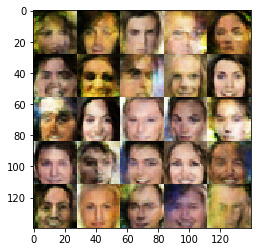

Epoch 1/1... Discriminator Loss: 1.3475... Generator Loss: 0.5430
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.7049
Epoch 1/1... Discriminator Loss: 1.0431... Generator Loss: 0.8768
Epoch 1/1... Discriminator Loss: 1.2785... Generator Loss: 0.8648
Epoch 1/1... Discriminator Loss: 1.0740... Generator Loss: 0.9275
Epoch 1/1... Discriminator Loss: 1.5533... Generator Loss: 0.4250
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.4256
Epoch 1/1... Discriminator Loss: 1.4314... Generator Loss: 0.4874
Epoch 1/1... Discriminator Loss: 1.3683... Generator Loss: 0.6227
Epoch 1/1... Discriminator Loss: 1.2796... Generator Loss: 0.6828


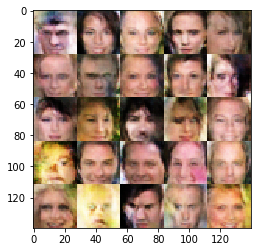

Epoch 1/1... Discriminator Loss: 1.1102... Generator Loss: 1.1839
Epoch 1/1... Discriminator Loss: 1.0733... Generator Loss: 1.1550
Epoch 1/1... Discriminator Loss: 1.2271... Generator Loss: 0.7551
Epoch 1/1... Discriminator Loss: 1.2635... Generator Loss: 1.2814
Epoch 1/1... Discriminator Loss: 1.2154... Generator Loss: 1.3376
Epoch 1/1... Discriminator Loss: 1.1699... Generator Loss: 1.2727
Epoch 1/1... Discriminator Loss: 1.1835... Generator Loss: 0.7281
Epoch 1/1... Discriminator Loss: 1.3234... Generator Loss: 0.5067
Epoch 1/1... Discriminator Loss: 1.1437... Generator Loss: 0.8086
Epoch 1/1... Discriminator Loss: 1.3256... Generator Loss: 0.9772


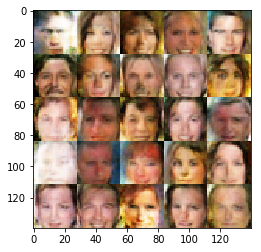

Epoch 1/1... Discriminator Loss: 1.2991... Generator Loss: 0.5677
Epoch 1/1... Discriminator Loss: 1.1400... Generator Loss: 0.8944
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.5278
Epoch 1/1... Discriminator Loss: 1.3716... Generator Loss: 0.5682
Epoch 1/1... Discriminator Loss: 1.0871... Generator Loss: 0.8362
Epoch 1/1... Discriminator Loss: 1.5597... Generator Loss: 0.4154
Epoch 1/1... Discriminator Loss: 1.1310... Generator Loss: 0.8563
Epoch 1/1... Discriminator Loss: 1.2480... Generator Loss: 0.9375
Epoch 1/1... Discriminator Loss: 1.8352... Generator Loss: 0.2834
Epoch 1/1... Discriminator Loss: 1.2273... Generator Loss: 0.7489


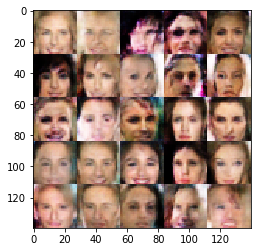

Epoch 1/1... Discriminator Loss: 1.3743... Generator Loss: 0.5328
Epoch 1/1... Discriminator Loss: 1.3531... Generator Loss: 0.5035
Epoch 1/1... Discriminator Loss: 1.1614... Generator Loss: 0.5972
Epoch 1/1... Discriminator Loss: 1.0832... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.4350... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.1902... Generator Loss: 0.7008
Epoch 1/1... Discriminator Loss: 1.5154... Generator Loss: 0.5144
Epoch 1/1... Discriminator Loss: 1.0986... Generator Loss: 1.0793
Epoch 1/1... Discriminator Loss: 1.0591... Generator Loss: 0.9978
Epoch 1/1... Discriminator Loss: 1.0328... Generator Loss: 0.8322


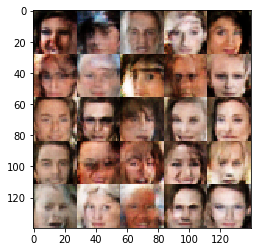

Epoch 1/1... Discriminator Loss: 1.0929... Generator Loss: 1.0942
Epoch 1/1... Discriminator Loss: 1.2643... Generator Loss: 0.6647
Epoch 1/1... Discriminator Loss: 1.1100... Generator Loss: 1.0034
Epoch 1/1... Discriminator Loss: 1.1903... Generator Loss: 0.8393
Epoch 1/1... Discriminator Loss: 1.4568... Generator Loss: 0.5380
Epoch 1/1... Discriminator Loss: 1.1850... Generator Loss: 1.0936
Epoch 1/1... Discriminator Loss: 1.3017... Generator Loss: 0.6412
Epoch 1/1... Discriminator Loss: 1.3868... Generator Loss: 0.5609
Epoch 1/1... Discriminator Loss: 1.1432... Generator Loss: 0.7796
Epoch 1/1... Discriminator Loss: 1.7834... Generator Loss: 0.3472


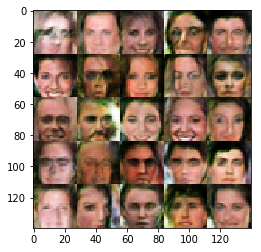

Epoch 1/1... Discriminator Loss: 1.4430... Generator Loss: 0.6701
Epoch 1/1... Discriminator Loss: 1.2131... Generator Loss: 0.6497
Epoch 1/1... Discriminator Loss: 1.7773... Generator Loss: 0.3348
Epoch 1/1... Discriminator Loss: 1.2651... Generator Loss: 0.5879
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.6510
Epoch 1/1... Discriminator Loss: 1.2732... Generator Loss: 0.7884
Epoch 1/1... Discriminator Loss: 1.1456... Generator Loss: 0.8108
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.7518
Epoch 1/1... Discriminator Loss: 1.1930... Generator Loss: 0.8043
Epoch 1/1... Discriminator Loss: 1.4788... Generator Loss: 0.6102


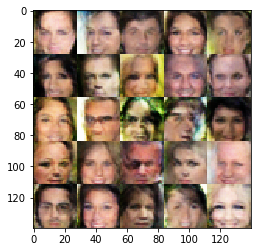

Epoch 1/1... Discriminator Loss: 1.4384... Generator Loss: 0.4855
Epoch 1/1... Discriminator Loss: 1.1303... Generator Loss: 0.8492
Epoch 1/1... Discriminator Loss: 1.3830... Generator Loss: 0.5211
Epoch 1/1... Discriminator Loss: 1.3849... Generator Loss: 0.4771
Epoch 1/1... Discriminator Loss: 1.2735... Generator Loss: 0.6570
Epoch 1/1... Discriminator Loss: 1.4453... Generator Loss: 0.4657
Epoch 1/1... Discriminator Loss: 1.2621... Generator Loss: 0.6935
Epoch 1/1... Discriminator Loss: 1.2210... Generator Loss: 0.6934
Epoch 1/1... Discriminator Loss: 1.1622... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.3277... Generator Loss: 0.5874


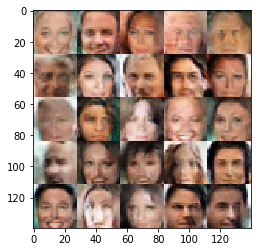

Epoch 1/1... Discriminator Loss: 1.5089... Generator Loss: 0.4014
Epoch 1/1... Discriminator Loss: 1.8610... Generator Loss: 0.3100
Epoch 1/1... Discriminator Loss: 1.1386... Generator Loss: 1.0990
Epoch 1/1... Discriminator Loss: 1.1344... Generator Loss: 0.8717
Epoch 1/1... Discriminator Loss: 1.4197... Generator Loss: 0.5230
Epoch 1/1... Discriminator Loss: 1.4025... Generator Loss: 0.5261
Epoch 1/1... Discriminator Loss: 1.2875... Generator Loss: 0.9843
Epoch 1/1... Discriminator Loss: 1.3085... Generator Loss: 0.5590
Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.6735
Epoch 1/1... Discriminator Loss: 1.4810... Generator Loss: 0.4644


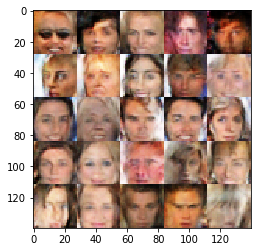

Epoch 1/1... Discriminator Loss: 1.0536... Generator Loss: 0.9291
Epoch 1/1... Discriminator Loss: 1.1674... Generator Loss: 0.8172
Epoch 1/1... Discriminator Loss: 1.0300... Generator Loss: 1.1957
Epoch 1/1... Discriminator Loss: 1.3510... Generator Loss: 0.5324
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 1.1503
Epoch 1/1... Discriminator Loss: 1.6636... Generator Loss: 0.3598
Epoch 1/1... Discriminator Loss: 1.5492... Generator Loss: 0.4181
Epoch 1/1... Discriminator Loss: 1.7682... Generator Loss: 0.3438
Epoch 1/1... Discriminator Loss: 1.3649... Generator Loss: 0.5750
Epoch 1/1... Discriminator Loss: 1.4223... Generator Loss: 0.4849


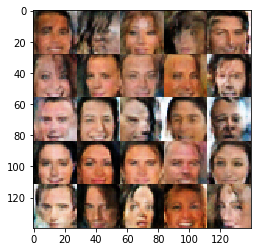

Epoch 1/1... Discriminator Loss: 1.3555... Generator Loss: 0.6041
Epoch 1/1... Discriminator Loss: 1.2595... Generator Loss: 0.7183
Epoch 1/1... Discriminator Loss: 1.4131... Generator Loss: 0.5905
Epoch 1/1... Discriminator Loss: 1.2582... Generator Loss: 0.7843
Epoch 1/1... Discriminator Loss: 1.7866... Generator Loss: 0.3267
Epoch 1/1... Discriminator Loss: 0.9810... Generator Loss: 0.9110
Epoch 1/1... Discriminator Loss: 1.3740... Generator Loss: 0.7436
Epoch 1/1... Discriminator Loss: 1.1764... Generator Loss: 1.1574
Epoch 1/1... Discriminator Loss: 1.6365... Generator Loss: 0.5461
Epoch 1/1... Discriminator Loss: 1.0703... Generator Loss: 0.8558


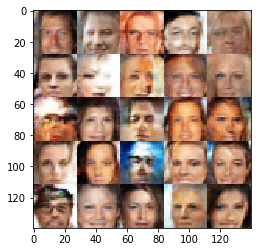

Epoch 1/1... Discriminator Loss: 1.1767... Generator Loss: 0.7425
Epoch 1/1... Discriminator Loss: 1.3073... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.1915... Generator Loss: 1.1256
Epoch 1/1... Discriminator Loss: 1.2160... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.1933... Generator Loss: 0.8773
Epoch 1/1... Discriminator Loss: 1.4279... Generator Loss: 0.4713
Epoch 1/1... Discriminator Loss: 1.3733... Generator Loss: 0.5033
Epoch 1/1... Discriminator Loss: 1.4519... Generator Loss: 0.8131
Epoch 1/1... Discriminator Loss: 1.2663... Generator Loss: 0.8549
Epoch 1/1... Discriminator Loss: 1.4570... Generator Loss: 0.4680


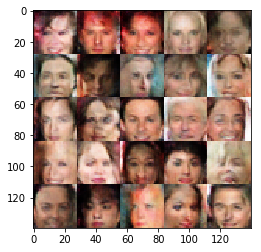

Epoch 1/1... Discriminator Loss: 1.2336... Generator Loss: 0.5742
Epoch 1/1... Discriminator Loss: 1.0247... Generator Loss: 1.2074
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 1.0528
Epoch 1/1... Discriminator Loss: 1.2424... Generator Loss: 0.6079
Epoch 1/1... Discriminator Loss: 1.1884... Generator Loss: 1.1137
Epoch 1/1... Discriminator Loss: 1.3156... Generator Loss: 0.7037
Epoch 1/1... Discriminator Loss: 1.2315... Generator Loss: 1.1713
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.6406
Epoch 1/1... Discriminator Loss: 1.1574... Generator Loss: 0.8207
Epoch 1/1... Discriminator Loss: 1.0897... Generator Loss: 1.1437


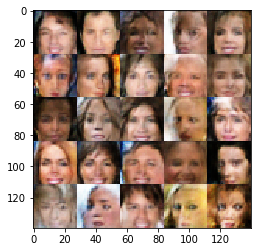

Epoch 1/1... Discriminator Loss: 1.0536... Generator Loss: 1.0277
Epoch 1/1... Discriminator Loss: 1.3928... Generator Loss: 0.5504
Epoch 1/1... Discriminator Loss: 1.1169... Generator Loss: 0.7886
Epoch 1/1... Discriminator Loss: 1.1667... Generator Loss: 0.8404
Epoch 1/1... Discriminator Loss: 1.7038... Generator Loss: 0.3438
Epoch 1/1... Discriminator Loss: 1.8639... Generator Loss: 0.3317
Epoch 1/1... Discriminator Loss: 1.2588... Generator Loss: 0.6520
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.5929
Epoch 1/1... Discriminator Loss: 1.3089... Generator Loss: 0.5297
Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.7033


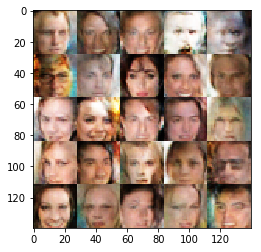

Epoch 1/1... Discriminator Loss: 1.1528... Generator Loss: 0.8981
Epoch 1/1... Discriminator Loss: 1.0226... Generator Loss: 1.1116
Epoch 1/1... Discriminator Loss: 0.9683... Generator Loss: 1.2302
Epoch 1/1... Discriminator Loss: 1.0646... Generator Loss: 1.2989
Epoch 1/1... Discriminator Loss: 1.6010... Generator Loss: 0.3249
Epoch 1/1... Discriminator Loss: 1.2987... Generator Loss: 0.5913
Epoch 1/1... Discriminator Loss: 1.3759... Generator Loss: 0.5829
Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 0.9932
Epoch 1/1... Discriminator Loss: 1.1893... Generator Loss: 0.7476
Epoch 1/1... Discriminator Loss: 1.1693... Generator Loss: 1.2347


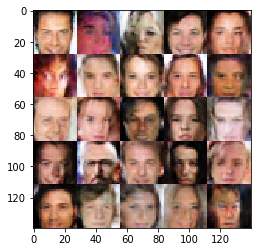

Epoch 1/1... Discriminator Loss: 1.1943... Generator Loss: 0.6941
Epoch 1/1... Discriminator Loss: 1.6975... Generator Loss: 0.3550
Epoch 1/1... Discriminator Loss: 1.0223... Generator Loss: 0.8714
Epoch 1/1... Discriminator Loss: 0.9475... Generator Loss: 0.9507
Epoch 1/1... Discriminator Loss: 1.4079... Generator Loss: 0.5570
Epoch 1/1... Discriminator Loss: 1.3614... Generator Loss: 0.5249
Epoch 1/1... Discriminator Loss: 1.2446... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 1.2167... Generator Loss: 0.9789
Epoch 1/1... Discriminator Loss: 1.2647... Generator Loss: 0.7381
Epoch 1/1... Discriminator Loss: 1.1634... Generator Loss: 0.8993


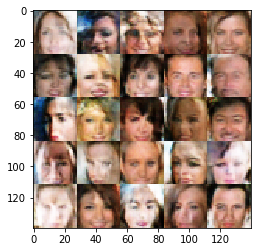

Epoch 1/1... Discriminator Loss: 1.1210... Generator Loss: 0.9155
Epoch 1/1... Discriminator Loss: 1.5792... Generator Loss: 0.4495
Epoch 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.7141
Epoch 1/1... Discriminator Loss: 1.1032... Generator Loss: 0.7841
Epoch 1/1... Discriminator Loss: 1.4500... Generator Loss: 0.5035
Epoch 1/1... Discriminator Loss: 1.2881... Generator Loss: 0.5417
Epoch 1/1... Discriminator Loss: 1.1240... Generator Loss: 0.8703
Epoch 1/1... Discriminator Loss: 1.4830... Generator Loss: 0.5013
Epoch 1/1... Discriminator Loss: 1.4647... Generator Loss: 0.4858
Epoch 1/1... Discriminator Loss: 1.0660... Generator Loss: 1.0101


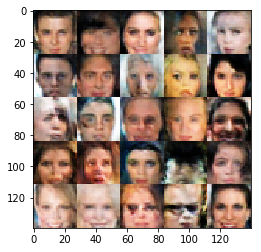

Epoch 1/1... Discriminator Loss: 1.4410... Generator Loss: 0.4393
Epoch 1/1... Discriminator Loss: 1.2391... Generator Loss: 0.7404
Epoch 1/1... Discriminator Loss: 1.0074... Generator Loss: 1.2074
Epoch 1/1... Discriminator Loss: 1.2694... Generator Loss: 0.6474
Epoch 1/1... Discriminator Loss: 1.1142... Generator Loss: 0.7149
Epoch 1/1... Discriminator Loss: 1.3719... Generator Loss: 0.5780
Epoch 1/1... Discriminator Loss: 1.3395... Generator Loss: 0.8271
Epoch 1/1... Discriminator Loss: 1.2858... Generator Loss: 0.6166
Epoch 1/1... Discriminator Loss: 1.1933... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.2465... Generator Loss: 0.6596


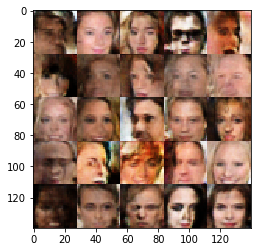

Epoch 1/1... Discriminator Loss: 1.5495... Generator Loss: 0.4130
Epoch 1/1... Discriminator Loss: 1.3620... Generator Loss: 0.6030
Epoch 1/1... Discriminator Loss: 1.4388... Generator Loss: 0.5154
Epoch 1/1... Discriminator Loss: 1.4853... Generator Loss: 0.4623
Epoch 1/1... Discriminator Loss: 1.3436... Generator Loss: 1.2290
Epoch 1/1... Discriminator Loss: 1.5296... Generator Loss: 0.4425
Epoch 1/1... Discriminator Loss: 0.9536... Generator Loss: 1.1179
Epoch 1/1... Discriminator Loss: 1.3715... Generator Loss: 0.5049
Epoch 1/1... Discriminator Loss: 1.3560... Generator Loss: 0.5928
Epoch 1/1... Discriminator Loss: 1.0975... Generator Loss: 0.7474


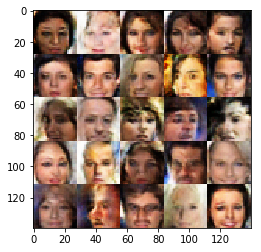

Epoch 1/1... Discriminator Loss: 1.3511... Generator Loss: 0.5362
Epoch 1/1... Discriminator Loss: 1.2336... Generator Loss: 0.5773
Epoch 1/1... Discriminator Loss: 1.1694... Generator Loss: 0.8572
Epoch 1/1... Discriminator Loss: 1.3060... Generator Loss: 0.6854
Epoch 1/1... Discriminator Loss: 1.1615... Generator Loss: 1.3925
Epoch 1/1... Discriminator Loss: 1.0271... Generator Loss: 1.3314
Epoch 1/1... Discriminator Loss: 1.3276... Generator Loss: 0.7234
Epoch 1/1... Discriminator Loss: 1.6684... Generator Loss: 0.3240
Epoch 1/1... Discriminator Loss: 1.2855... Generator Loss: 1.1033
Epoch 1/1... Discriminator Loss: 1.3063... Generator Loss: 0.8462


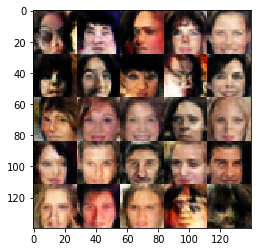

Epoch 1/1... Discriminator Loss: 1.7489... Generator Loss: 0.3783
Epoch 1/1... Discriminator Loss: 1.4498... Generator Loss: 0.4790
Epoch 1/1... Discriminator Loss: 1.3437... Generator Loss: 0.6000
Epoch 1/1... Discriminator Loss: 1.1394... Generator Loss: 0.9366
Epoch 1/1... Discriminator Loss: 1.7637... Generator Loss: 0.3457
Epoch 1/1... Discriminator Loss: 1.1073... Generator Loss: 1.0152
Epoch 1/1... Discriminator Loss: 1.2906... Generator Loss: 0.5424
Epoch 1/1... Discriminator Loss: 1.0848... Generator Loss: 0.8665
Epoch 1/1... Discriminator Loss: 1.1578... Generator Loss: 0.8416
Epoch 1/1... Discriminator Loss: 1.0667... Generator Loss: 1.1381


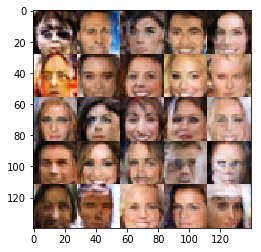

Epoch 1/1... Discriminator Loss: 1.2377... Generator Loss: 0.6271
Epoch 1/1... Discriminator Loss: 1.4230... Generator Loss: 0.4798
Epoch 1/1... Discriminator Loss: 1.3909... Generator Loss: 0.4490
Epoch 1/1... Discriminator Loss: 1.3974... Generator Loss: 0.4724
Epoch 1/1... Discriminator Loss: 1.1417... Generator Loss: 0.9491
Epoch 1/1... Discriminator Loss: 1.0715... Generator Loss: 0.8482
Epoch 1/1... Discriminator Loss: 1.1964... Generator Loss: 1.2416
Epoch 1/1... Discriminator Loss: 1.0563... Generator Loss: 1.2682
Epoch 1/1... Discriminator Loss: 1.0903... Generator Loss: 0.9859
Epoch 1/1... Discriminator Loss: 0.8715... Generator Loss: 1.1472


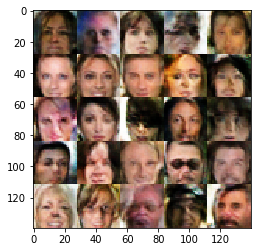

Epoch 1/1... Discriminator Loss: 1.1965... Generator Loss: 0.8216
Epoch 1/1... Discriminator Loss: 1.1233... Generator Loss: 0.7629
Epoch 1/1... Discriminator Loss: 1.6290... Generator Loss: 0.4021
Epoch 1/1... Discriminator Loss: 1.3570... Generator Loss: 0.4739
Epoch 1/1... Discriminator Loss: 1.1461... Generator Loss: 0.7685
Epoch 1/1... Discriminator Loss: 1.1672... Generator Loss: 0.7015
Epoch 1/1... Discriminator Loss: 1.3074... Generator Loss: 0.5797
Epoch 1/1... Discriminator Loss: 1.1167... Generator Loss: 1.1456
Epoch 1/1... Discriminator Loss: 1.5473... Generator Loss: 0.4040
Epoch 1/1... Discriminator Loss: 1.2128... Generator Loss: 0.6462


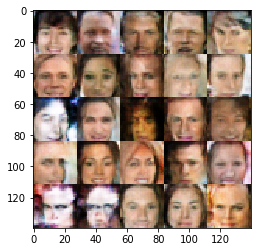

Epoch 1/1... Discriminator Loss: 1.2820... Generator Loss: 0.7091
Epoch 1/1... Discriminator Loss: 1.2545... Generator Loss: 0.5758
Epoch 1/1... Discriminator Loss: 1.5363... Generator Loss: 0.4466
Epoch 1/1... Discriminator Loss: 1.4102... Generator Loss: 0.5093
Epoch 1/1... Discriminator Loss: 1.6234... Generator Loss: 0.3982
Epoch 1/1... Discriminator Loss: 1.2721... Generator Loss: 0.5432
Epoch 1/1... Discriminator Loss: 1.5356... Generator Loss: 0.3894
Epoch 1/1... Discriminator Loss: 1.2785... Generator Loss: 0.9321
Epoch 1/1... Discriminator Loss: 0.9945... Generator Loss: 0.9181
Epoch 1/1... Discriminator Loss: 1.4894... Generator Loss: 0.4942


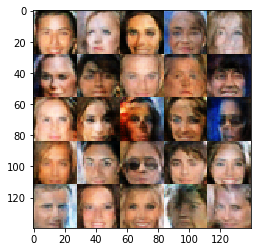

Epoch 1/1... Discriminator Loss: 1.1671... Generator Loss: 1.1940
Epoch 1/1... Discriminator Loss: 1.5286... Generator Loss: 0.4703
Epoch 1/1... Discriminator Loss: 1.1300... Generator Loss: 1.1608
Epoch 1/1... Discriminator Loss: 1.2375... Generator Loss: 0.6603
Epoch 1/1... Discriminator Loss: 1.0976... Generator Loss: 1.0147
Epoch 1/1... Discriminator Loss: 1.1912... Generator Loss: 0.7301
Epoch 1/1... Discriminator Loss: 1.4183... Generator Loss: 0.4371
Epoch 1/1... Discriminator Loss: 1.2222... Generator Loss: 0.8261
Epoch 1/1... Discriminator Loss: 1.2305... Generator Loss: 0.9818
Epoch 1/1... Discriminator Loss: 1.4634... Generator Loss: 0.4468


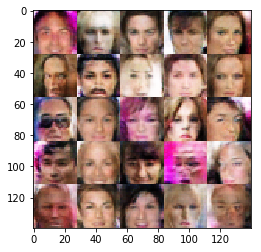

Epoch 1/1... Discriminator Loss: 1.2056... Generator Loss: 0.9920
Epoch 1/1... Discriminator Loss: 1.1296... Generator Loss: 0.9561
Epoch 1/1... Discriminator Loss: 1.4461... Generator Loss: 0.4760
Epoch 1/1... Discriminator Loss: 1.1896... Generator Loss: 1.0313
Epoch 1/1... Discriminator Loss: 1.0772... Generator Loss: 0.8421
Epoch 1/1... Discriminator Loss: 1.4030... Generator Loss: 0.5040
Epoch 1/1... Discriminator Loss: 1.2027... Generator Loss: 0.7047
Epoch 1/1... Discriminator Loss: 1.0271... Generator Loss: 1.4313
Epoch 1/1... Discriminator Loss: 1.2511... Generator Loss: 0.7147
Epoch 1/1... Discriminator Loss: 1.2806... Generator Loss: 0.7862


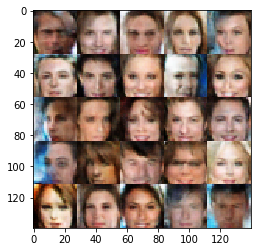

Epoch 1/1... Discriminator Loss: 1.1025... Generator Loss: 0.9637
Epoch 1/1... Discriminator Loss: 1.1893... Generator Loss: 0.7070
Epoch 1/1... Discriminator Loss: 1.0466... Generator Loss: 1.0657
Epoch 1/1... Discriminator Loss: 1.2222... Generator Loss: 1.4652
Epoch 1/1... Discriminator Loss: 1.2389... Generator Loss: 0.5938
Epoch 1/1... Discriminator Loss: 1.4842... Generator Loss: 0.4171
Epoch 1/1... Discriminator Loss: 1.2598... Generator Loss: 0.5441
Epoch 1/1... Discriminator Loss: 1.4037... Generator Loss: 1.4301
Epoch 1/1... Discriminator Loss: 1.1846... Generator Loss: 0.8036
Epoch 1/1... Discriminator Loss: 1.1539... Generator Loss: 0.6388


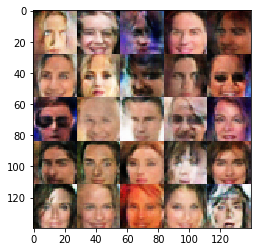

Epoch 1/1... Discriminator Loss: 1.4585... Generator Loss: 0.4394
Epoch 1/1... Discriminator Loss: 1.1830... Generator Loss: 0.7151
Epoch 1/1... Discriminator Loss: 1.0690... Generator Loss: 0.8845
Epoch 1/1... Discriminator Loss: 1.1727... Generator Loss: 0.7978
Epoch 1/1... Discriminator Loss: 1.0588... Generator Loss: 1.1837
Epoch 1/1... Discriminator Loss: 1.8236... Generator Loss: 0.3828
Epoch 1/1... Discriminator Loss: 1.3707... Generator Loss: 0.5328
Epoch 1/1... Discriminator Loss: 1.2622... Generator Loss: 0.5793
Epoch 1/1... Discriminator Loss: 1.2554... Generator Loss: 0.5850
Epoch 1/1... Discriminator Loss: 1.2810... Generator Loss: 0.6375


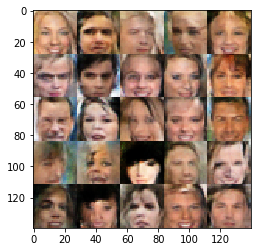

Epoch 1/1... Discriminator Loss: 1.4564... Generator Loss: 0.4767
Epoch 1/1... Discriminator Loss: 1.1367... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 1.3944... Generator Loss: 0.5293
Epoch 1/1... Discriminator Loss: 1.6178... Generator Loss: 0.3737
Epoch 1/1... Discriminator Loss: 1.2739... Generator Loss: 0.6198
Epoch 1/1... Discriminator Loss: 1.7896... Generator Loss: 0.3179
Epoch 1/1... Discriminator Loss: 1.1702... Generator Loss: 0.8202
Epoch 1/1... Discriminator Loss: 1.2321... Generator Loss: 0.6195
Epoch 1/1... Discriminator Loss: 1.2225... Generator Loss: 0.9133
Epoch 1/1... Discriminator Loss: 1.1282... Generator Loss: 0.7057


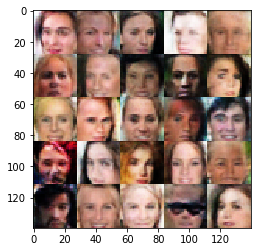

Epoch 1/1... Discriminator Loss: 1.1979... Generator Loss: 0.6567
Epoch 1/1... Discriminator Loss: 1.2054... Generator Loss: 0.5668
Epoch 1/1... Discriminator Loss: 1.0076... Generator Loss: 0.9885
Epoch 1/1... Discriminator Loss: 1.1661... Generator Loss: 0.7616
Epoch 1/1... Discriminator Loss: 1.0830... Generator Loss: 1.3847
Epoch 1/1... Discriminator Loss: 1.0410... Generator Loss: 1.5826
Epoch 1/1... Discriminator Loss: 1.3048... Generator Loss: 0.5619
Epoch 1/1... Discriminator Loss: 1.5761... Generator Loss: 0.4109
Epoch 1/1... Discriminator Loss: 1.1816... Generator Loss: 0.8609
Epoch 1/1... Discriminator Loss: 1.1474... Generator Loss: 0.7688


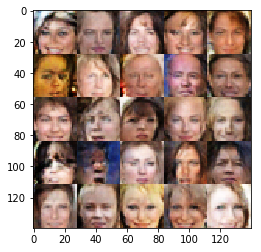

Epoch 1/1... Discriminator Loss: 1.3055... Generator Loss: 0.5634
Epoch 1/1... Discriminator Loss: 1.3242... Generator Loss: 0.5374
Epoch 1/1... Discriminator Loss: 1.2658... Generator Loss: 1.1951
Epoch 1/1... Discriminator Loss: 1.2309... Generator Loss: 0.6498
Epoch 1/1... Discriminator Loss: 1.1496... Generator Loss: 0.9889
Epoch 1/1... Discriminator Loss: 1.2211... Generator Loss: 1.2089
Epoch 1/1... Discriminator Loss: 1.2648... Generator Loss: 0.6192
Epoch 1/1... Discriminator Loss: 1.0210... Generator Loss: 1.0733
Epoch 1/1... Discriminator Loss: 1.2904... Generator Loss: 0.6594
Epoch 1/1... Discriminator Loss: 1.2238... Generator Loss: 0.8548


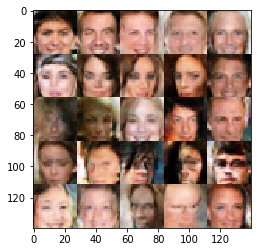

Epoch 1/1... Discriminator Loss: 1.0708... Generator Loss: 1.4374
Epoch 1/1... Discriminator Loss: 1.2172... Generator Loss: 1.4831
Epoch 1/1... Discriminator Loss: 1.1043... Generator Loss: 1.9559
Epoch 1/1... Discriminator Loss: 1.2725... Generator Loss: 0.6307
Epoch 1/1... Discriminator Loss: 1.2230... Generator Loss: 0.7123
Epoch 1/1... Discriminator Loss: 1.3842... Generator Loss: 0.5838
Epoch 1/1... Discriminator Loss: 1.0935... Generator Loss: 1.0019
Epoch 1/1... Discriminator Loss: 1.2490... Generator Loss: 0.7302
Epoch 1/1... Discriminator Loss: 1.0564... Generator Loss: 1.1213
Epoch 1/1... Discriminator Loss: 1.1675... Generator Loss: 0.7030


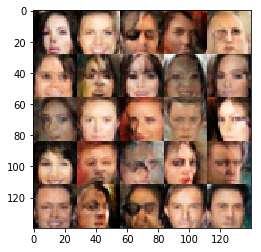

Epoch 1/1... Discriminator Loss: 1.1371... Generator Loss: 0.8608
Epoch 1/1... Discriminator Loss: 1.3167... Generator Loss: 1.0230
Epoch 1/1... Discriminator Loss: 1.0320... Generator Loss: 1.2643
Epoch 1/1... Discriminator Loss: 1.0831... Generator Loss: 0.8051
Epoch 1/1... Discriminator Loss: 1.7322... Generator Loss: 0.3818
Epoch 1/1... Discriminator Loss: 1.0863... Generator Loss: 0.9318
Epoch 1/1... Discriminator Loss: 1.3778... Generator Loss: 1.7448
Epoch 1/1... Discriminator Loss: 1.4346... Generator Loss: 0.4645
Epoch 1/1... Discriminator Loss: 1.5261... Generator Loss: 0.4318
Epoch 1/1... Discriminator Loss: 1.0606... Generator Loss: 0.9160


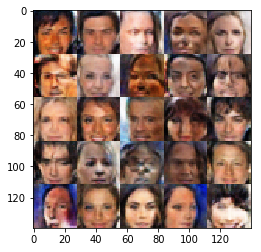

Epoch 1/1... Discriminator Loss: 1.0984... Generator Loss: 0.8165
Epoch 1/1... Discriminator Loss: 1.0504... Generator Loss: 1.1442
Epoch 1/1... Discriminator Loss: 1.2260... Generator Loss: 0.7484
Epoch 1/1... Discriminator Loss: 1.1300... Generator Loss: 0.7837
Epoch 1/1... Discriminator Loss: 0.9040... Generator Loss: 1.1685
Epoch 1/1... Discriminator Loss: 1.0706... Generator Loss: 0.8525
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 1.0787... Generator Loss: 0.8116
Epoch 1/1... Discriminator Loss: 1.1618... Generator Loss: 0.9333
Epoch 1/1... Discriminator Loss: 1.2572... Generator Loss: 0.6112


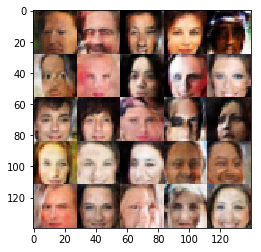

Epoch 1/1... Discriminator Loss: 1.0613... Generator Loss: 0.8426
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.4764
Epoch 1/1... Discriminator Loss: 1.2880... Generator Loss: 0.6251
Epoch 1/1... Discriminator Loss: 1.0527... Generator Loss: 1.0679
Epoch 1/1... Discriminator Loss: 1.1315... Generator Loss: 0.7188
Epoch 1/1... Discriminator Loss: 1.3658... Generator Loss: 0.5098
Epoch 1/1... Discriminator Loss: 1.3632... Generator Loss: 0.5324
Epoch 1/1... Discriminator Loss: 1.0781... Generator Loss: 0.7683
Epoch 1/1... Discriminator Loss: 1.2288... Generator Loss: 0.6138
Epoch 1/1... Discriminator Loss: 1.0057... Generator Loss: 1.0352


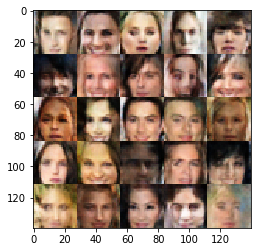

Epoch 1/1... Discriminator Loss: 1.0538... Generator Loss: 0.8193
Epoch 1/1... Discriminator Loss: 1.2558... Generator Loss: 0.5615
Epoch 1/1... Discriminator Loss: 1.3752... Generator Loss: 0.5210
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 1.2630
Epoch 1/1... Discriminator Loss: 1.0525... Generator Loss: 1.1144
Epoch 1/1... Discriminator Loss: 1.4777... Generator Loss: 0.3987
Epoch 1/1... Discriminator Loss: 1.2344... Generator Loss: 0.6276
Epoch 1/1... Discriminator Loss: 1.0799... Generator Loss: 0.8235
Epoch 1/1... Discriminator Loss: 1.4162... Generator Loss: 0.5119
Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.7480


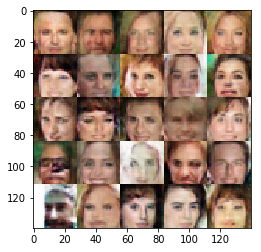

Epoch 1/1... Discriminator Loss: 0.9824... Generator Loss: 1.2043
Epoch 1/1... Discriminator Loss: 1.0386... Generator Loss: 1.1546
Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 0.7360
Epoch 1/1... Discriminator Loss: 1.8182... Generator Loss: 0.3070
Epoch 1/1... Discriminator Loss: 1.1559... Generator Loss: 1.5258
Epoch 1/1... Discriminator Loss: 0.9885... Generator Loss: 0.9881
Epoch 1/1... Discriminator Loss: 1.2210... Generator Loss: 0.6396
Epoch 1/1... Discriminator Loss: 1.2635... Generator Loss: 0.9409
Epoch 1/1... Discriminator Loss: 1.4474... Generator Loss: 0.5236
Epoch 1/1... Discriminator Loss: 1.2645... Generator Loss: 0.6666


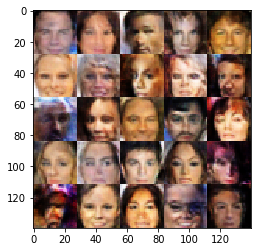

Epoch 1/1... Discriminator Loss: 1.3659... Generator Loss: 0.5409
Epoch 1/1... Discriminator Loss: 1.0743... Generator Loss: 0.8177
Epoch 1/1... Discriminator Loss: 1.1941... Generator Loss: 0.6472
Epoch 1/1... Discriminator Loss: 1.0229... Generator Loss: 0.9146
Epoch 1/1... Discriminator Loss: 0.9824... Generator Loss: 1.2829
Epoch 1/1... Discriminator Loss: 1.1682... Generator Loss: 0.6818
Epoch 1/1... Discriminator Loss: 1.1724... Generator Loss: 1.6179
Epoch 1/1... Discriminator Loss: 1.3930... Generator Loss: 0.5006
Epoch 1/1... Discriminator Loss: 1.0945... Generator Loss: 0.7659
Epoch 1/1... Discriminator Loss: 0.9907... Generator Loss: 1.0292


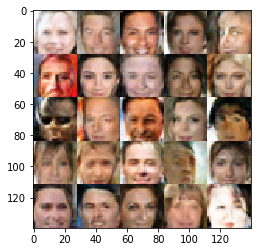

Epoch 1/1... Discriminator Loss: 1.4106... Generator Loss: 0.5506
Epoch 1/1... Discriminator Loss: 1.2749... Generator Loss: 0.6917
Epoch 1/1... Discriminator Loss: 1.0966... Generator Loss: 0.7658
Epoch 1/1... Discriminator Loss: 1.3404... Generator Loss: 0.4981
Epoch 1/1... Discriminator Loss: 1.2478... Generator Loss: 0.5575
Epoch 1/1... Discriminator Loss: 1.3079... Generator Loss: 0.5817
Epoch 1/1... Discriminator Loss: 1.4925... Generator Loss: 0.4298
Epoch 1/1... Discriminator Loss: 1.0469... Generator Loss: 0.8478
Epoch 1/1... Discriminator Loss: 1.3558... Generator Loss: 0.5412
Epoch 1/1... Discriminator Loss: 1.5027... Generator Loss: 0.4071


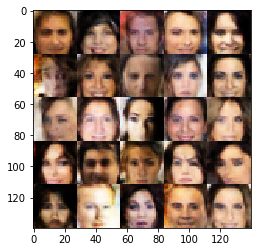

Epoch 1/1... Discriminator Loss: 1.0505... Generator Loss: 1.3060
Epoch 1/1... Discriminator Loss: 1.1172... Generator Loss: 0.7642
Epoch 1/1... Discriminator Loss: 1.1214... Generator Loss: 0.7285
Epoch 1/1... Discriminator Loss: 1.1391... Generator Loss: 0.7075
Epoch 1/1... Discriminator Loss: 1.1345... Generator Loss: 0.7138
Epoch 1/1... Discriminator Loss: 1.1231... Generator Loss: 0.7567
Epoch 1/1... Discriminator Loss: 1.3891... Generator Loss: 0.7198
Epoch 1/1... Discriminator Loss: 1.5161... Generator Loss: 0.4578
Epoch 1/1... Discriminator Loss: 1.2275... Generator Loss: 0.6226
Epoch 1/1... Discriminator Loss: 1.4335... Generator Loss: 0.4827


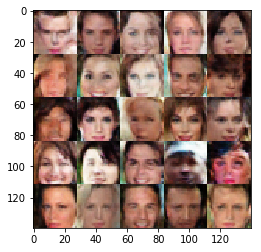

Epoch 1/1... Discriminator Loss: 0.9564... Generator Loss: 0.9969
Epoch 1/1... Discriminator Loss: 1.1660... Generator Loss: 0.6703
Epoch 1/1... Discriminator Loss: 1.0156... Generator Loss: 0.8791
Epoch 1/1... Discriminator Loss: 1.8415... Generator Loss: 0.3334
Epoch 1/1... Discriminator Loss: 1.0981... Generator Loss: 0.9400
Epoch 1/1... Discriminator Loss: 1.1740... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 1.2592... Generator Loss: 0.6136
Epoch 1/1... Discriminator Loss: 0.9612... Generator Loss: 1.2258
Epoch 1/1... Discriminator Loss: 1.0767... Generator Loss: 0.7762
Epoch 1/1... Discriminator Loss: 1.4422... Generator Loss: 0.4760


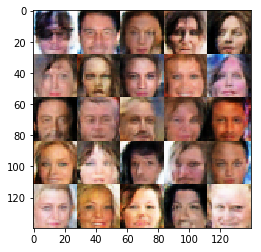

Epoch 1/1... Discriminator Loss: 1.1306... Generator Loss: 0.8817
Epoch 1/1... Discriminator Loss: 1.3217... Generator Loss: 0.5536
Epoch 1/1... Discriminator Loss: 1.2008... Generator Loss: 1.0308
Epoch 1/1... Discriminator Loss: 1.0862... Generator Loss: 1.0944
Epoch 1/1... Discriminator Loss: 1.1394... Generator Loss: 0.6728
Epoch 1/1... Discriminator Loss: 1.1976... Generator Loss: 0.8738
Epoch 1/1... Discriminator Loss: 1.6196... Generator Loss: 0.3998
Epoch 1/1... Discriminator Loss: 1.2060... Generator Loss: 0.6442
Epoch 1/1... Discriminator Loss: 1.2290... Generator Loss: 0.7076
Epoch 1/1... Discriminator Loss: 1.1878... Generator Loss: 0.7611


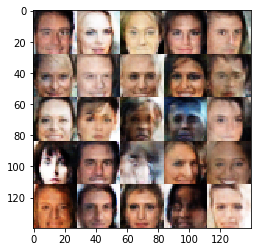

Epoch 1/1... Discriminator Loss: 1.3538... Generator Loss: 0.8710
Epoch 1/1... Discriminator Loss: 1.1778... Generator Loss: 0.7835
Epoch 1/1... Discriminator Loss: 1.3476... Generator Loss: 0.6401
Epoch 1/1... Discriminator Loss: 1.2912... Generator Loss: 0.6413
Epoch 1/1... Discriminator Loss: 1.1065... Generator Loss: 1.0606
Epoch 1/1... Discriminator Loss: 1.1165... Generator Loss: 1.0277
Epoch 1/1... Discriminator Loss: 1.1490... Generator Loss: 0.7634
Epoch 1/1... Discriminator Loss: 1.0868... Generator Loss: 0.8251
Epoch 1/1... Discriminator Loss: 1.2314... Generator Loss: 0.6427
Epoch 1/1... Discriminator Loss: 1.9102... Generator Loss: 0.3066


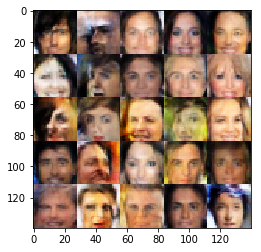

Epoch 1/1... Discriminator Loss: 1.1892... Generator Loss: 0.6893
Epoch 1/1... Discriminator Loss: 1.1356... Generator Loss: 1.6708
Epoch 1/1... Discriminator Loss: 0.9360... Generator Loss: 1.0813
Epoch 1/1... Discriminator Loss: 1.1499... Generator Loss: 0.7160
Epoch 1/1... Discriminator Loss: 1.1361... Generator Loss: 0.8904
Epoch 1/1... Discriminator Loss: 1.1660... Generator Loss: 0.6961
Epoch 1/1... Discriminator Loss: 1.1799... Generator Loss: 0.6776
Epoch 1/1... Discriminator Loss: 0.9364... Generator Loss: 1.1171
Epoch 1/1... Discriminator Loss: 1.2007... Generator Loss: 1.0573
Epoch 1/1... Discriminator Loss: 0.9477... Generator Loss: 1.1417


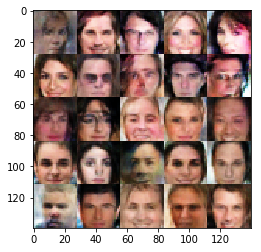

Epoch 1/1... Discriminator Loss: 1.2062... Generator Loss: 0.9155
Epoch 1/1... Discriminator Loss: 1.3029... Generator Loss: 0.5359
Epoch 1/1... Discriminator Loss: 1.3290... Generator Loss: 1.9359
Epoch 1/1... Discriminator Loss: 1.1552... Generator Loss: 0.6333
Epoch 1/1... Discriminator Loss: 1.2472... Generator Loss: 0.6096
Epoch 1/1... Discriminator Loss: 1.3001... Generator Loss: 0.6075
Epoch 1/1... Discriminator Loss: 0.9707... Generator Loss: 1.0920
Epoch 1/1... Discriminator Loss: 1.3385... Generator Loss: 0.5430
Epoch 1/1... Discriminator Loss: 1.2017... Generator Loss: 0.6254
Epoch 1/1... Discriminator Loss: 0.9370... Generator Loss: 1.1104


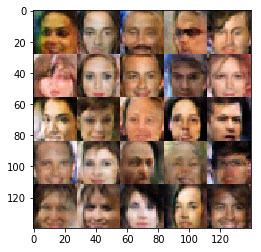

Epoch 1/1... Discriminator Loss: 1.1500... Generator Loss: 0.8644
Epoch 1/1... Discriminator Loss: 1.2070... Generator Loss: 0.6920
Epoch 1/1... Discriminator Loss: 1.5670... Generator Loss: 0.4530
Epoch 1/1... Discriminator Loss: 0.9234... Generator Loss: 1.0725
Epoch 1/1... Discriminator Loss: 1.2405... Generator Loss: 0.7574
Epoch 1/1... Discriminator Loss: 1.3341... Generator Loss: 0.5298
Epoch 1/1... Discriminator Loss: 1.2284... Generator Loss: 0.5828
Epoch 1/1... Discriminator Loss: 1.5516... Generator Loss: 0.4175
Epoch 1/1... Discriminator Loss: 1.3621... Generator Loss: 0.5490
Epoch 1/1... Discriminator Loss: 1.4270... Generator Loss: 0.4762


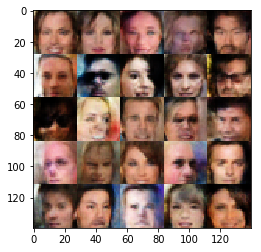

Epoch 1/1... Discriminator Loss: 1.1938... Generator Loss: 0.9689
Epoch 1/1... Discriminator Loss: 1.1564... Generator Loss: 0.7270
Epoch 1/1... Discriminator Loss: 1.2575... Generator Loss: 0.6612
Epoch 1/1... Discriminator Loss: 1.4694... Generator Loss: 0.4422
Epoch 1/1... Discriminator Loss: 1.1599... Generator Loss: 0.7459
Epoch 1/1... Discriminator Loss: 1.3996... Generator Loss: 0.4932
Epoch 1/1... Discriminator Loss: 1.0594... Generator Loss: 0.9181
Epoch 1/1... Discriminator Loss: 1.1346... Generator Loss: 1.1878
Epoch 1/1... Discriminator Loss: 1.1773... Generator Loss: 0.6274
Epoch 1/1... Discriminator Loss: 1.0360... Generator Loss: 0.7864


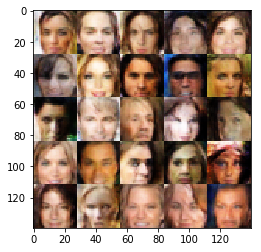

Epoch 1/1... Discriminator Loss: 1.3756... Generator Loss: 0.5025
Epoch 1/1... Discriminator Loss: 1.5071... Generator Loss: 0.4707
Epoch 1/1... Discriminator Loss: 0.9700... Generator Loss: 1.0904
Epoch 1/1... Discriminator Loss: 0.9062... Generator Loss: 1.2050
Epoch 1/1... Discriminator Loss: 2.3607... Generator Loss: 0.1676
Epoch 1/1... Discriminator Loss: 1.1179... Generator Loss: 1.0913
Epoch 1/1... Discriminator Loss: 1.2784... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.0053... Generator Loss: 1.0485
Epoch 1/1... Discriminator Loss: 1.1968... Generator Loss: 0.7553
Epoch 1/1... Discriminator Loss: 1.0527... Generator Loss: 0.9195


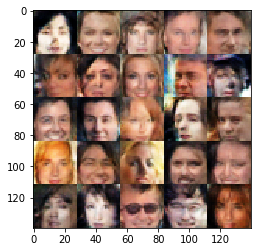

Epoch 1/1... Discriminator Loss: 1.0039... Generator Loss: 1.3466
Epoch 1/1... Discriminator Loss: 1.2695... Generator Loss: 0.5843
Epoch 1/1... Discriminator Loss: 1.1473... Generator Loss: 0.6571
Epoch 1/1... Discriminator Loss: 1.7495... Generator Loss: 0.3260
Epoch 1/1... Discriminator Loss: 1.4787... Generator Loss: 0.4899
Epoch 1/1... Discriminator Loss: 1.1648... Generator Loss: 0.7544
Epoch 1/1... Discriminator Loss: 1.1519... Generator Loss: 1.2350
Epoch 1/1... Discriminator Loss: 1.4408... Generator Loss: 0.4742
Epoch 1/1... Discriminator Loss: 1.1887... Generator Loss: 0.7233
Epoch 1/1... Discriminator Loss: 1.0758... Generator Loss: 0.8441


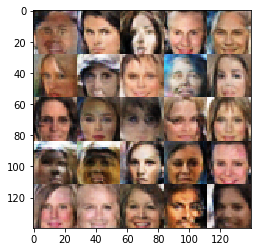

Epoch 1/1... Discriminator Loss: 0.9183... Generator Loss: 1.1974
Epoch 1/1... Discriminator Loss: 1.3120... Generator Loss: 0.6083
Epoch 1/1... Discriminator Loss: 1.0147... Generator Loss: 0.9202
Epoch 1/1... Discriminator Loss: 1.1115... Generator Loss: 0.8877
Epoch 1/1... Discriminator Loss: 1.1556... Generator Loss: 0.7196
Epoch 1/1... Discriminator Loss: 1.0653... Generator Loss: 0.7437
Epoch 1/1... Discriminator Loss: 1.0849... Generator Loss: 0.8955
Epoch 1/1... Discriminator Loss: 1.2067... Generator Loss: 0.7216
Epoch 1/1... Discriminator Loss: 1.0348... Generator Loss: 0.8491
Epoch 1/1... Discriminator Loss: 1.3991... Generator Loss: 0.4895


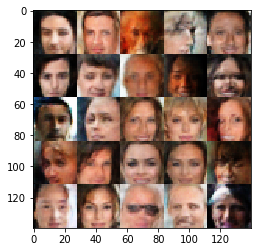

Epoch 1/1... Discriminator Loss: 1.0859... Generator Loss: 0.6494
Epoch 1/1... Discriminator Loss: 1.3134... Generator Loss: 0.5316
Epoch 1/1... Discriminator Loss: 1.2112... Generator Loss: 0.5961
Epoch 1/1... Discriminator Loss: 1.2142... Generator Loss: 0.6144
Epoch 1/1... Discriminator Loss: 1.4164... Generator Loss: 0.5044
Epoch 1/1... Discriminator Loss: 0.9989... Generator Loss: 0.8274
Epoch 1/1... Discriminator Loss: 1.2281... Generator Loss: 0.5114
Epoch 1/1... Discriminator Loss: 1.1226... Generator Loss: 0.7535
Epoch 1/1... Discriminator Loss: 1.3884... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 1.0451... Generator Loss: 0.9080


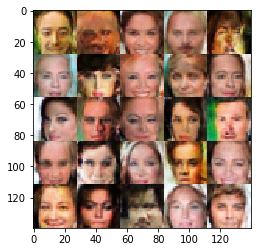

Epoch 1/1... Discriminator Loss: 0.9299... Generator Loss: 0.9567
Epoch 1/1... Discriminator Loss: 1.0808... Generator Loss: 1.2538
Epoch 1/1... Discriminator Loss: 1.1860... Generator Loss: 1.1154
Epoch 1/1... Discriminator Loss: 1.5927... Generator Loss: 0.3696
Epoch 1/1... Discriminator Loss: 1.0384... Generator Loss: 0.7763
Epoch 1/1... Discriminator Loss: 1.3144... Generator Loss: 0.5817
Epoch 1/1... Discriminator Loss: 1.5069... Generator Loss: 0.3989
Epoch 1/1... Discriminator Loss: 1.3710... Generator Loss: 0.5276
Epoch 1/1... Discriminator Loss: 1.0229... Generator Loss: 0.9358
Epoch 1/1... Discriminator Loss: 1.2905... Generator Loss: 0.6371


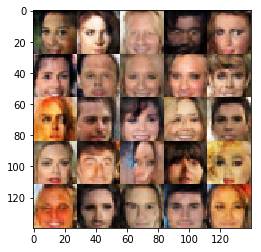

Epoch 1/1... Discriminator Loss: 0.9703... Generator Loss: 0.9794
Epoch 1/1... Discriminator Loss: 1.0818... Generator Loss: 1.4054
Epoch 1/1... Discriminator Loss: 1.0659... Generator Loss: 0.6597
Epoch 1/1... Discriminator Loss: 1.1646... Generator Loss: 0.5814
Epoch 1/1... Discriminator Loss: 1.0099... Generator Loss: 1.3512
Epoch 1/1... Discriminator Loss: 1.3161... Generator Loss: 0.5989
Epoch 1/1... Discriminator Loss: 1.0193... Generator Loss: 0.8212
Epoch 1/1... Discriminator Loss: 1.3346... Generator Loss: 0.5256
Epoch 1/1... Discriminator Loss: 1.2012... Generator Loss: 0.7500
Epoch 1/1... Discriminator Loss: 1.1322... Generator Loss: 0.8818


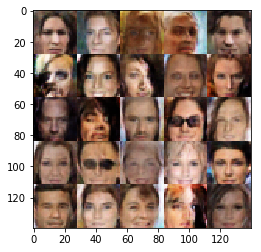

Epoch 1/1... Discriminator Loss: 1.2029... Generator Loss: 0.8396
Epoch 1/1... Discriminator Loss: 1.6523... Generator Loss: 0.3561
Epoch 1/1... Discriminator Loss: 1.3133... Generator Loss: 0.5960
Epoch 1/1... Discriminator Loss: 0.9135... Generator Loss: 0.9554
Epoch 1/1... Discriminator Loss: 1.2569... Generator Loss: 0.5841
Epoch 1/1... Discriminator Loss: 1.0437... Generator Loss: 0.9757
Epoch 1/1... Discriminator Loss: 1.0171... Generator Loss: 0.9628
Epoch 1/1... Discriminator Loss: 1.2392... Generator Loss: 0.6781
Epoch 1/1... Discriminator Loss: 1.3102... Generator Loss: 0.5456
Epoch 1/1... Discriminator Loss: 1.0937... Generator Loss: 1.2568


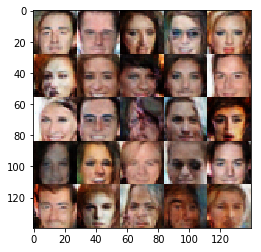

Epoch 1/1... Discriminator Loss: 1.1498... Generator Loss: 0.9034
Epoch 1/1... Discriminator Loss: 1.2320... Generator Loss: 0.8712
Epoch 1/1... Discriminator Loss: 1.1670... Generator Loss: 0.9455
Epoch 1/1... Discriminator Loss: 0.8295... Generator Loss: 1.1304
Epoch 1/1... Discriminator Loss: 1.2328... Generator Loss: 1.1328
Epoch 1/1... Discriminator Loss: 1.1909... Generator Loss: 0.7534
Epoch 1/1... Discriminator Loss: 1.1634... Generator Loss: 1.0648
Epoch 1/1... Discriminator Loss: 1.2336... Generator Loss: 0.6490
Epoch 1/1... Discriminator Loss: 1.1560... Generator Loss: 1.2804
Epoch 1/1... Discriminator Loss: 1.3584... Generator Loss: 0.5846


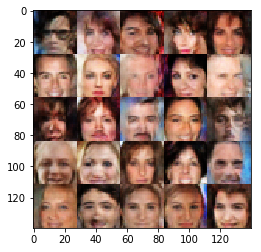

Epoch 1/1... Discriminator Loss: 1.1869... Generator Loss: 0.6127
Epoch 1/1... Discriminator Loss: 1.2110... Generator Loss: 0.6692
Epoch 1/1... Discriminator Loss: 1.2708... Generator Loss: 0.5926
Epoch 1/1... Discriminator Loss: 1.0595... Generator Loss: 1.4002
Epoch 1/1... Discriminator Loss: 1.4327... Generator Loss: 0.4780
Epoch 1/1... Discriminator Loss: 1.0520... Generator Loss: 0.8990
Epoch 1/1... Discriminator Loss: 1.7910... Generator Loss: 0.2812
Epoch 1/1... Discriminator Loss: 0.9499... Generator Loss: 1.0846
Epoch 1/1... Discriminator Loss: 0.9300... Generator Loss: 1.0400
Epoch 1/1... Discriminator Loss: 1.0375... Generator Loss: 1.0430


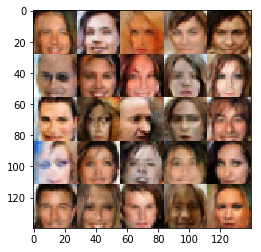

Epoch 1/1... Discriminator Loss: 1.5133... Generator Loss: 0.5246
Epoch 1/1... Discriminator Loss: 1.1138... Generator Loss: 0.8581
Epoch 1/1... Discriminator Loss: 0.9298... Generator Loss: 1.4841
Epoch 1/1... Discriminator Loss: 0.8866... Generator Loss: 1.1258
Epoch 1/1... Discriminator Loss: 0.9818... Generator Loss: 0.9651
Epoch 1/1... Discriminator Loss: 0.9201... Generator Loss: 1.1907
Epoch 1/1... Discriminator Loss: 1.6310... Generator Loss: 0.4311
Epoch 1/1... Discriminator Loss: 1.1427... Generator Loss: 0.7719
Epoch 1/1... Discriminator Loss: 1.2713... Generator Loss: 0.6339
Epoch 1/1... Discriminator Loss: 1.3634... Generator Loss: 0.4745


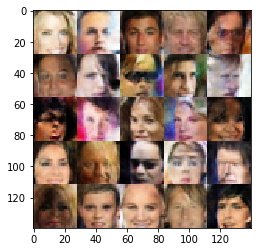

Epoch 1/1... Discriminator Loss: 1.4475... Generator Loss: 0.4546
Epoch 1/1... Discriminator Loss: 1.0858... Generator Loss: 0.9598
Epoch 1/1... Discriminator Loss: 1.1047... Generator Loss: 0.7044
Epoch 1/1... Discriminator Loss: 1.2282... Generator Loss: 0.6762
Epoch 1/1... Discriminator Loss: 1.0765... Generator Loss: 0.9909
Epoch 1/1... Discriminator Loss: 0.9430... Generator Loss: 1.1890
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.5141
Epoch 1/1... Discriminator Loss: 0.8445... Generator Loss: 1.1938
Epoch 1/1... Discriminator Loss: 1.3863... Generator Loss: 0.4978
Epoch 1/1... Discriminator Loss: 0.9098... Generator Loss: 1.3063


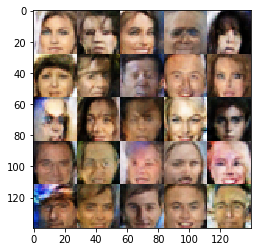

Epoch 1/1... Discriminator Loss: 1.2627... Generator Loss: 0.8234
Epoch 1/1... Discriminator Loss: 1.2391... Generator Loss: 0.5695
Epoch 1/1... Discriminator Loss: 0.9254... Generator Loss: 1.0797
Epoch 1/1... Discriminator Loss: 0.8679... Generator Loss: 1.1935
Epoch 1/1... Discriminator Loss: 0.9713... Generator Loss: 0.9406
Epoch 1/1... Discriminator Loss: 1.3388... Generator Loss: 0.5209
Epoch 1/1... Discriminator Loss: 1.0405... Generator Loss: 0.9931
Epoch 1/1... Discriminator Loss: 0.9531... Generator Loss: 1.1426
Epoch 1/1... Discriminator Loss: 1.4601... Generator Loss: 0.4370
Epoch 1/1... Discriminator Loss: 1.0260... Generator Loss: 0.9114


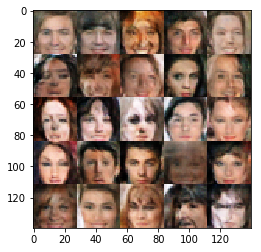

Epoch 1/1... Discriminator Loss: 1.2754... Generator Loss: 0.6485
Epoch 1/1... Discriminator Loss: 1.2251... Generator Loss: 0.7815
Epoch 1/1... Discriminator Loss: 1.1298... Generator Loss: 0.7495
Epoch 1/1... Discriminator Loss: 1.1610... Generator Loss: 0.6281
Epoch 1/1... Discriminator Loss: 0.9051... Generator Loss: 1.0431
Epoch 1/1... Discriminator Loss: 1.1526... Generator Loss: 0.6371
Epoch 1/1... Discriminator Loss: 1.3862... Generator Loss: 0.5851
Epoch 1/1... Discriminator Loss: 1.0033... Generator Loss: 1.0469
Epoch 1/1... Discriminator Loss: 1.0482... Generator Loss: 1.1149
Epoch 1/1... Discriminator Loss: 1.3636... Generator Loss: 0.5859


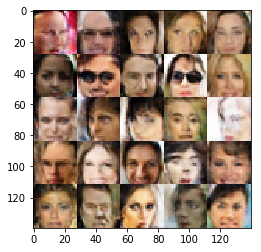

Epoch 1/1... Discriminator Loss: 1.7170... Generator Loss: 0.3160
Epoch 1/1... Discriminator Loss: 1.1746... Generator Loss: 0.6741
Epoch 1/1... Discriminator Loss: 1.3696... Generator Loss: 0.5358
Epoch 1/1... Discriminator Loss: 1.2212... Generator Loss: 0.5446
Epoch 1/1... Discriminator Loss: 0.9687... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 1.3482... Generator Loss: 0.5184
Epoch 1/1... Discriminator Loss: 1.0658... Generator Loss: 0.7805
Epoch 1/1... Discriminator Loss: 0.8007... Generator Loss: 1.2291
Epoch 1/1... Discriminator Loss: 0.9393... Generator Loss: 0.9019
Epoch 1/1... Discriminator Loss: 1.3438... Generator Loss: 0.5412


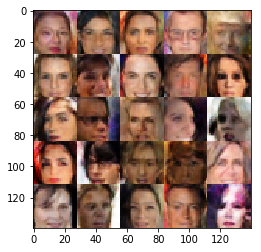

Epoch 1/1... Discriminator Loss: 0.8339... Generator Loss: 1.2975
Epoch 1/1... Discriminator Loss: 1.4480... Generator Loss: 0.4678
Epoch 1/1... Discriminator Loss: 1.3055... Generator Loss: 0.5387
Epoch 1/1... Discriminator Loss: 0.9941... Generator Loss: 0.7787
Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 0.6164
Epoch 1/1... Discriminator Loss: 1.5688... Generator Loss: 0.4051
Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 0.5713
Epoch 1/1... Discriminator Loss: 1.0522... Generator Loss: 0.7336
Epoch 1/1... Discriminator Loss: 1.1509... Generator Loss: 0.7068
Epoch 1/1... Discriminator Loss: 1.0225... Generator Loss: 1.5377


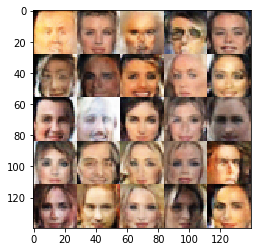

Epoch 1/1... Discriminator Loss: 1.0898... Generator Loss: 1.0199
Epoch 1/1... Discriminator Loss: 0.8248... Generator Loss: 1.0100
Epoch 1/1... Discriminator Loss: 1.2285... Generator Loss: 0.7601
Epoch 1/1... Discriminator Loss: 1.1232... Generator Loss: 1.4224
Epoch 1/1... Discriminator Loss: 1.0042... Generator Loss: 0.9460
Epoch 1/1... Discriminator Loss: 0.7655... Generator Loss: 1.5402
Epoch 1/1... Discriminator Loss: 0.9434... Generator Loss: 1.1086
Epoch 1/1... Discriminator Loss: 0.9553... Generator Loss: 0.9020
Epoch 1/1... Discriminator Loss: 0.9227... Generator Loss: 1.2436
Epoch 1/1... Discriminator Loss: 1.3153... Generator Loss: 0.5181


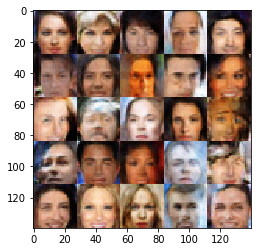

Epoch 1/1... Discriminator Loss: 1.2283... Generator Loss: 0.5269
Epoch 1/1... Discriminator Loss: 1.5647... Generator Loss: 0.3918
Epoch 1/1... Discriminator Loss: 1.1143... Generator Loss: 0.7588
Epoch 1/1... Discriminator Loss: 1.1561... Generator Loss: 0.7961
Epoch 1/1... Discriminator Loss: 0.9371... Generator Loss: 1.2004
Epoch 1/1... Discriminator Loss: 1.2196... Generator Loss: 0.6972
Epoch 1/1... Discriminator Loss: 1.1701... Generator Loss: 0.9720
Epoch 1/1... Discriminator Loss: 1.4981... Generator Loss: 0.4037
Epoch 1/1... Discriminator Loss: 1.1139... Generator Loss: 0.8063
Epoch 1/1... Discriminator Loss: 0.9303... Generator Loss: 1.4473


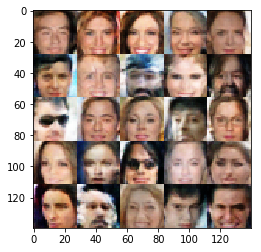

Epoch 1/1... Discriminator Loss: 1.0622... Generator Loss: 0.7925
Epoch 1/1... Discriminator Loss: 1.1716... Generator Loss: 0.7003
Epoch 1/1... Discriminator Loss: 1.1841... Generator Loss: 0.6742
Epoch 1/1... Discriminator Loss: 1.3794... Generator Loss: 0.5378
Epoch 1/1... Discriminator Loss: 1.0518... Generator Loss: 0.9431
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.7317
Epoch 1/1... Discriminator Loss: 1.0543... Generator Loss: 0.9059
Epoch 1/1... Discriminator Loss: 1.1312... Generator Loss: 0.8153
Epoch 1/1... Discriminator Loss: 1.2144... Generator Loss: 0.6299
Epoch 1/1... Discriminator Loss: 1.0626... Generator Loss: 0.9316


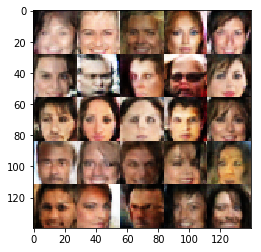

Epoch 1/1... Discriminator Loss: 1.3190... Generator Loss: 0.5284
Epoch 1/1... Discriminator Loss: 1.1026... Generator Loss: 1.0481
Epoch 1/1... Discriminator Loss: 1.0209... Generator Loss: 0.6899
Epoch 1/1... Discriminator Loss: 1.3296... Generator Loss: 0.7104
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.7168
Epoch 1/1... Discriminator Loss: 1.0668... Generator Loss: 1.6514
Epoch 1/1... Discriminator Loss: 1.5013... Generator Loss: 0.4367
Epoch 1/1... Discriminator Loss: 1.5187... Generator Loss: 0.4159
Epoch 1/1... Discriminator Loss: 1.3987... Generator Loss: 0.8808
Epoch 1/1... Discriminator Loss: 1.3326... Generator Loss: 0.5127


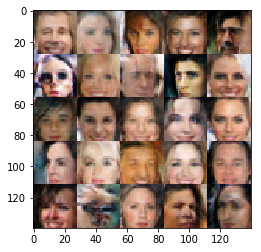

Epoch 1/1... Discriminator Loss: 1.1273... Generator Loss: 0.7549
Epoch 1/1... Discriminator Loss: 1.2935... Generator Loss: 0.6218
Epoch 1/1... Discriminator Loss: 1.0789... Generator Loss: 0.9160
Epoch 1/1... Discriminator Loss: 1.3506... Generator Loss: 0.6600
Epoch 1/1... Discriminator Loss: 1.1581... Generator Loss: 0.7900
Epoch 1/1... Discriminator Loss: 0.8687... Generator Loss: 1.3781
Epoch 1/1... Discriminator Loss: 1.1876... Generator Loss: 0.7260
Epoch 1/1... Discriminator Loss: 0.9306... Generator Loss: 1.1854
Epoch 1/1... Discriminator Loss: 1.2418... Generator Loss: 0.6824
Epoch 1/1... Discriminator Loss: 1.6210... Generator Loss: 0.3886


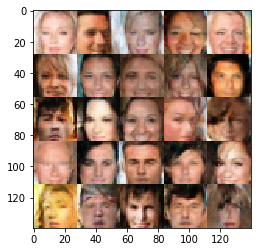

Epoch 1/1... Discriminator Loss: 1.2950... Generator Loss: 0.5743
Epoch 1/1... Discriminator Loss: 1.2287... Generator Loss: 0.5718
Epoch 1/1... Discriminator Loss: 1.8795... Generator Loss: 0.2893
Epoch 1/1... Discriminator Loss: 1.2966... Generator Loss: 0.5854
Epoch 1/1... Discriminator Loss: 1.0806... Generator Loss: 0.8830
Epoch 1/1... Discriminator Loss: 1.0737... Generator Loss: 0.9538
Epoch 1/1... Discriminator Loss: 1.2140... Generator Loss: 0.6351
Epoch 1/1... Discriminator Loss: 1.0623... Generator Loss: 1.1574
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 0.6517
Epoch 1/1... Discriminator Loss: 1.1738... Generator Loss: 0.8805


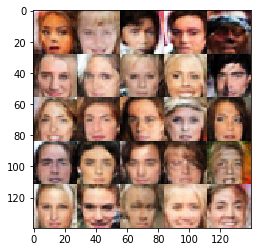

Epoch 1/1... Discriminator Loss: 1.0394... Generator Loss: 0.8577
Epoch 1/1... Discriminator Loss: 1.4667... Generator Loss: 0.5410
Epoch 1/1... Discriminator Loss: 0.9185... Generator Loss: 1.1137
Epoch 1/1... Discriminator Loss: 1.1106... Generator Loss: 1.1810
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 1.4904
Epoch 1/1... Discriminator Loss: 1.1119... Generator Loss: 1.1649
Epoch 1/1... Discriminator Loss: 1.1520... Generator Loss: 0.7679
Epoch 1/1... Discriminator Loss: 0.9982... Generator Loss: 1.2100
Epoch 1/1... Discriminator Loss: 1.1648... Generator Loss: 0.6072
Epoch 1/1... Discriminator Loss: 0.9378... Generator Loss: 1.0419


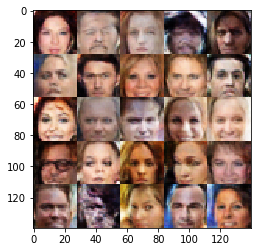

Epoch 1/1... Discriminator Loss: 1.1734... Generator Loss: 0.6194
Epoch 1/1... Discriminator Loss: 1.3571... Generator Loss: 0.5547
Epoch 1/1... Discriminator Loss: 1.0221... Generator Loss: 0.9114
Epoch 1/1... Discriminator Loss: 1.0141... Generator Loss: 0.8915
Epoch 1/1... Discriminator Loss: 1.1523... Generator Loss: 0.7571
Epoch 1/1... Discriminator Loss: 1.0547... Generator Loss: 1.0150
Epoch 1/1... Discriminator Loss: 1.2631... Generator Loss: 0.5471
Epoch 1/1... Discriminator Loss: 1.1997... Generator Loss: 0.6572
Epoch 1/1... Discriminator Loss: 0.9639... Generator Loss: 0.8237
Epoch 1/1... Discriminator Loss: 1.5760... Generator Loss: 0.4470


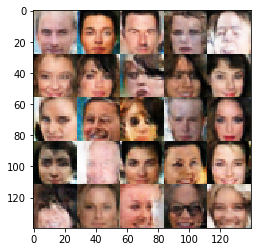

Epoch 1/1... Discriminator Loss: 1.2248... Generator Loss: 0.7018
Epoch 1/1... Discriminator Loss: 1.1618... Generator Loss: 0.7744
Epoch 1/1... Discriminator Loss: 1.3714... Generator Loss: 0.6084
Epoch 1/1... Discriminator Loss: 1.3088... Generator Loss: 0.5441
Epoch 1/1... Discriminator Loss: 1.1894... Generator Loss: 0.5522
Epoch 1/1... Discriminator Loss: 1.1028... Generator Loss: 0.7483
Epoch 1/1... Discriminator Loss: 1.6145... Generator Loss: 0.3681
Epoch 1/1... Discriminator Loss: 1.0534... Generator Loss: 0.7764
Epoch 1/1... Discriminator Loss: 1.0506... Generator Loss: 0.8901
Epoch 1/1... Discriminator Loss: 1.2961... Generator Loss: 0.5936


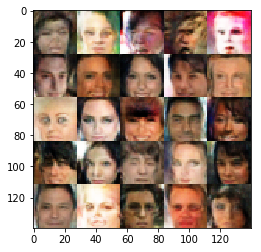

Epoch 1/1... Discriminator Loss: 0.9900... Generator Loss: 0.9777
Epoch 1/1... Discriminator Loss: 1.4167... Generator Loss: 0.5467
Epoch 1/1... Discriminator Loss: 1.0759... Generator Loss: 0.8716
Epoch 1/1... Discriminator Loss: 1.3921... Generator Loss: 0.4998
Epoch 1/1... Discriminator Loss: 1.0356... Generator Loss: 0.8845
Epoch 1/1... Discriminator Loss: 1.1211... Generator Loss: 0.8037
Epoch 1/1... Discriminator Loss: 0.8916... Generator Loss: 1.1404
Epoch 1/1... Discriminator Loss: 1.3712... Generator Loss: 0.5094
Epoch 1/1... Discriminator Loss: 1.2016... Generator Loss: 0.7632
Epoch 1/1... Discriminator Loss: 1.0984... Generator Loss: 0.8783


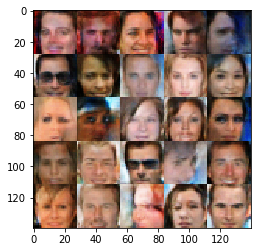

Epoch 1/1... Discriminator Loss: 1.3340... Generator Loss: 0.6320
Epoch 1/1... Discriminator Loss: 1.3471... Generator Loss: 0.5769
Epoch 1/1... Discriminator Loss: 1.5083... Generator Loss: 0.4724
Epoch 1/1... Discriminator Loss: 1.3516... Generator Loss: 0.6850
Epoch 1/1... Discriminator Loss: 1.1537... Generator Loss: 0.8136
Epoch 1/1... Discriminator Loss: 0.9668... Generator Loss: 1.1122
Epoch 1/1... Discriminator Loss: 1.0578... Generator Loss: 0.7748
Epoch 1/1... Discriminator Loss: 1.3092... Generator Loss: 0.6319
Epoch 1/1... Discriminator Loss: 0.9941... Generator Loss: 1.1840
Epoch 1/1... Discriminator Loss: 1.1852... Generator Loss: 0.8074


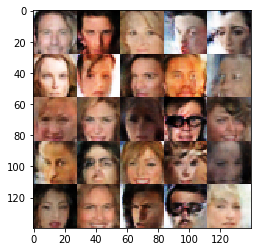

Epoch 1/1... Discriminator Loss: 1.1000... Generator Loss: 0.7856
Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 0.7290
Epoch 1/1... Discriminator Loss: 1.2014... Generator Loss: 0.9531
Epoch 1/1... Discriminator Loss: 1.4282... Generator Loss: 0.5425
Epoch 1/1... Discriminator Loss: 1.1016... Generator Loss: 0.8948
Epoch 1/1... Discriminator Loss: 1.2347... Generator Loss: 0.6272
Epoch 1/1... Discriminator Loss: 1.1403... Generator Loss: 0.9487
Epoch 1/1... Discriminator Loss: 1.4531... Generator Loss: 0.6176
Epoch 1/1... Discriminator Loss: 1.1981... Generator Loss: 1.1701
Epoch 1/1... Discriminator Loss: 1.4434... Generator Loss: 0.4390


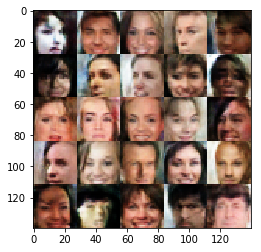

Epoch 1/1... Discriminator Loss: 1.4587... Generator Loss: 0.4753
Epoch 1/1... Discriminator Loss: 1.5765... Generator Loss: 0.4666
Epoch 1/1... Discriminator Loss: 1.2766... Generator Loss: 0.5338
Epoch 1/1... Discriminator Loss: 1.1266... Generator Loss: 0.6174
Epoch 1/1... Discriminator Loss: 0.9147... Generator Loss: 1.4846
Epoch 1/1... Discriminator Loss: 1.3230... Generator Loss: 0.6266
Epoch 1/1... Discriminator Loss: 1.5196... Generator Loss: 0.3857
Epoch 1/1... Discriminator Loss: 0.9012... Generator Loss: 0.9933
Epoch 1/1... Discriminator Loss: 1.4506... Generator Loss: 0.4406
Epoch 1/1... Discriminator Loss: 0.9580... Generator Loss: 1.2237


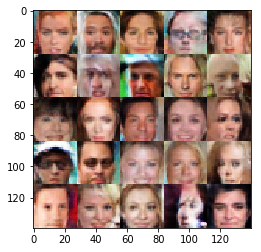

Epoch 1/1... Discriminator Loss: 1.3660... Generator Loss: 0.5775
Epoch 1/1... Discriminator Loss: 0.9644... Generator Loss: 0.9809
Epoch 1/1... Discriminator Loss: 1.5959... Generator Loss: 0.4790
Epoch 1/1... Discriminator Loss: 0.9906... Generator Loss: 1.3124
Epoch 1/1... Discriminator Loss: 1.5875... Generator Loss: 0.4454
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.5298
Epoch 1/1... Discriminator Loss: 1.1535... Generator Loss: 0.6911
Epoch 1/1... Discriminator Loss: 1.4085... Generator Loss: 0.6055
Epoch 1/1... Discriminator Loss: 1.0123... Generator Loss: 0.8610
Epoch 1/1... Discriminator Loss: 1.1799... Generator Loss: 0.6808


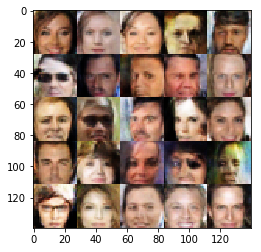

Epoch 1/1... Discriminator Loss: 1.1051... Generator Loss: 0.7949
Epoch 1/1... Discriminator Loss: 0.9994... Generator Loss: 1.3058
Epoch 1/1... Discriminator Loss: 1.2334... Generator Loss: 0.5658
Epoch 1/1... Discriminator Loss: 0.9541... Generator Loss: 1.0284
Epoch 1/1... Discriminator Loss: 0.9410... Generator Loss: 0.9514
Epoch 1/1... Discriminator Loss: 1.2494... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 1.2579... Generator Loss: 0.6234
Epoch 1/1... Discriminator Loss: 0.9759... Generator Loss: 0.8374
Epoch 1/1... Discriminator Loss: 1.4822... Generator Loss: 0.5167
Epoch 1/1... Discriminator Loss: 0.9084... Generator Loss: 1.2980


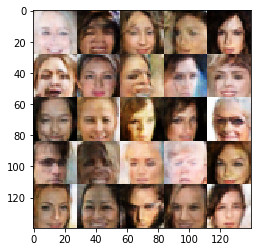

Epoch 1/1... Discriminator Loss: 1.0146... Generator Loss: 0.7728
Epoch 1/1... Discriminator Loss: 0.9072... Generator Loss: 1.1283
Epoch 1/1... Discriminator Loss: 1.0084... Generator Loss: 1.0745
Epoch 1/1... Discriminator Loss: 0.9974... Generator Loss: 1.2503
Epoch 1/1... Discriminator Loss: 1.4048... Generator Loss: 0.4798
Epoch 1/1... Discriminator Loss: 0.8254... Generator Loss: 1.3353
Epoch 1/1... Discriminator Loss: 1.0018... Generator Loss: 0.7903
Epoch 1/1... Discriminator Loss: 1.8688... Generator Loss: 0.2866
Epoch 1/1... Discriminator Loss: 1.0778... Generator Loss: 1.0306
Epoch 1/1... Discriminator Loss: 1.7196... Generator Loss: 0.3339


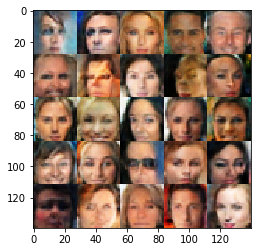

Epoch 1/1... Discriminator Loss: 0.8640... Generator Loss: 1.4193
Epoch 1/1... Discriminator Loss: 0.9443... Generator Loss: 1.2325
Epoch 1/1... Discriminator Loss: 0.9792... Generator Loss: 1.3566
Epoch 1/1... Discriminator Loss: 0.9917... Generator Loss: 1.3014
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.4663
Epoch 1/1... Discriminator Loss: 1.1966... Generator Loss: 1.2559
Epoch 1/1... Discriminator Loss: 1.3328... Generator Loss: 0.5098
Epoch 1/1... Discriminator Loss: 0.9073... Generator Loss: 1.2075
Epoch 1/1... Discriminator Loss: 1.2031... Generator Loss: 0.6040
Epoch 1/1... Discriminator Loss: 1.1034... Generator Loss: 1.6556


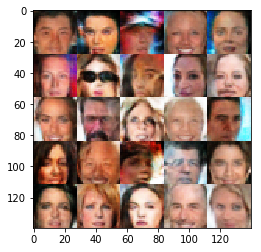

Epoch 1/1... Discriminator Loss: 1.1109... Generator Loss: 0.9569
Epoch 1/1... Discriminator Loss: 1.0664... Generator Loss: 0.8752
Epoch 1/1... Discriminator Loss: 1.2677... Generator Loss: 0.5649
Epoch 1/1... Discriminator Loss: 1.2836... Generator Loss: 0.6356
Epoch 1/1... Discriminator Loss: 0.8965... Generator Loss: 1.1735
Epoch 1/1... Discriminator Loss: 0.8700... Generator Loss: 1.6051
Epoch 1/1... Discriminator Loss: 0.9921... Generator Loss: 0.9924
Epoch 1/1... Discriminator Loss: 1.2518... Generator Loss: 0.6285
Epoch 1/1... Discriminator Loss: 1.2878... Generator Loss: 0.5829
Epoch 1/1... Discriminator Loss: 1.2819... Generator Loss: 0.7116


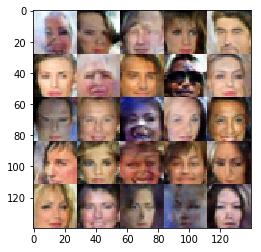

Epoch 1/1... Discriminator Loss: 1.0312... Generator Loss: 0.7769
Epoch 1/1... Discriminator Loss: 1.1347... Generator Loss: 0.7815
Epoch 1/1... Discriminator Loss: 1.4467... Generator Loss: 0.4825
Epoch 1/1... Discriminator Loss: 1.0120... Generator Loss: 0.8096
Epoch 1/1... Discriminator Loss: 1.1187... Generator Loss: 0.8517
Epoch 1/1... Discriminator Loss: 0.9648... Generator Loss: 1.0392
Epoch 1/1... Discriminator Loss: 0.9683... Generator Loss: 1.4614
Epoch 1/1... Discriminator Loss: 1.2614... Generator Loss: 0.5652
Epoch 1/1... Discriminator Loss: 0.8390... Generator Loss: 1.4962
Epoch 1/1... Discriminator Loss: 1.1128... Generator Loss: 0.7251


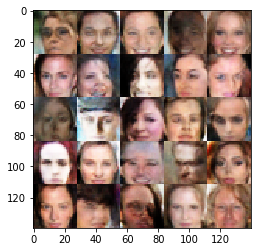

Epoch 1/1... Discriminator Loss: 1.1061... Generator Loss: 0.7969
Epoch 1/1... Discriminator Loss: 1.1243... Generator Loss: 1.0242
Epoch 1/1... Discriminator Loss: 1.4316... Generator Loss: 0.4940
Epoch 1/1... Discriminator Loss: 1.0827... Generator Loss: 0.8717
Epoch 1/1... Discriminator Loss: 1.0035... Generator Loss: 1.1641
Epoch 1/1... Discriminator Loss: 0.9613... Generator Loss: 1.1901
Epoch 1/1... Discriminator Loss: 0.9231... Generator Loss: 1.0054
Epoch 1/1... Discriminator Loss: 1.1446... Generator Loss: 1.0965
Epoch 1/1... Discriminator Loss: 1.3735... Generator Loss: 0.6180
Epoch 1/1... Discriminator Loss: 1.1251... Generator Loss: 0.8061


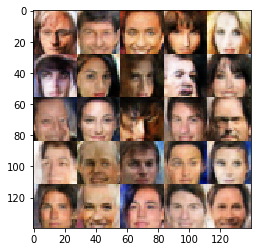

Epoch 1/1... Discriminator Loss: 1.2474... Generator Loss: 0.6757
Epoch 1/1... Discriminator Loss: 0.8680... Generator Loss: 1.3740
Epoch 1/1... Discriminator Loss: 1.6798... Generator Loss: 0.4158
Epoch 1/1... Discriminator Loss: 1.3763... Generator Loss: 0.4597
Epoch 1/1... Discriminator Loss: 0.7520... Generator Loss: 1.3550
Epoch 1/1... Discriminator Loss: 1.0507... Generator Loss: 0.7248
Epoch 1/1... Discriminator Loss: 0.9755... Generator Loss: 1.2520
Epoch 1/1... Discriminator Loss: 1.1288... Generator Loss: 0.8145
Epoch 1/1... Discriminator Loss: 1.5694... Generator Loss: 0.4340
Epoch 1/1... Discriminator Loss: 0.9572... Generator Loss: 1.0005


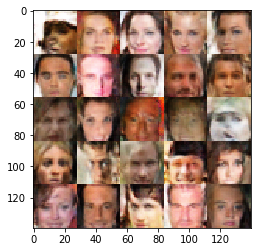

Epoch 1/1... Discriminator Loss: 1.6918... Generator Loss: 0.4797
Epoch 1/1... Discriminator Loss: 1.0997... Generator Loss: 0.7305
Epoch 1/1... Discriminator Loss: 1.0292... Generator Loss: 0.9333
Epoch 1/1... Discriminator Loss: 0.9474... Generator Loss: 1.2408
Epoch 1/1... Discriminator Loss: 1.0546... Generator Loss: 1.0127
Epoch 1/1... Discriminator Loss: 1.2422... Generator Loss: 0.6498
Epoch 1/1... Discriminator Loss: 1.2560... Generator Loss: 0.9061
Epoch 1/1... Discriminator Loss: 0.9875... Generator Loss: 0.9777
Epoch 1/1... Discriminator Loss: 0.9029... Generator Loss: 1.0055
Epoch 1/1... Discriminator Loss: 1.1442... Generator Loss: 0.6616


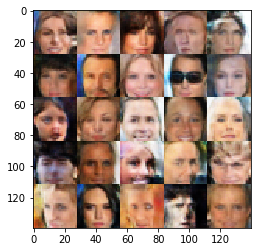

Epoch 1/1... Discriminator Loss: 1.0674... Generator Loss: 0.8847
Epoch 1/1... Discriminator Loss: 1.0522... Generator Loss: 0.9093
Epoch 1/1... Discriminator Loss: 0.8543... Generator Loss: 1.4492
Epoch 1/1... Discriminator Loss: 2.0031... Generator Loss: 0.3364
Epoch 1/1... Discriminator Loss: 0.8148... Generator Loss: 1.4005
Epoch 1/1... Discriminator Loss: 1.0106... Generator Loss: 0.9863
Epoch 1/1... Discriminator Loss: 1.0802... Generator Loss: 0.7950
Epoch 1/1... Discriminator Loss: 1.3775... Generator Loss: 0.4848
Epoch 1/1... Discriminator Loss: 0.6208... Generator Loss: 1.7292
Epoch 1/1... Discriminator Loss: 0.7093... Generator Loss: 1.7777


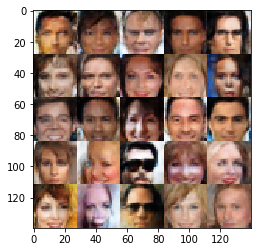

Epoch 1/1... Discriminator Loss: 1.2781... Generator Loss: 0.6341
Epoch 1/1... Discriminator Loss: 0.9118... Generator Loss: 0.8453
Epoch 1/1... Discriminator Loss: 1.1063... Generator Loss: 0.7883
Epoch 1/1... Discriminator Loss: 0.9679... Generator Loss: 1.1431
Epoch 1/1... Discriminator Loss: 0.8023... Generator Loss: 1.3446
Epoch 1/1... Discriminator Loss: 1.2159... Generator Loss: 0.6540
Epoch 1/1... Discriminator Loss: 1.0835... Generator Loss: 0.7289
Epoch 1/1... Discriminator Loss: 1.2771... Generator Loss: 0.6177
Epoch 1/1... Discriminator Loss: 1.9542... Generator Loss: 0.3384
Epoch 1/1... Discriminator Loss: 1.2168... Generator Loss: 0.5996


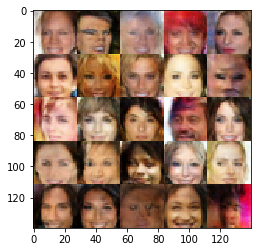

Epoch 1/1... Discriminator Loss: 1.1357... Generator Loss: 1.0167
Epoch 1/1... Discriminator Loss: 0.9698... Generator Loss: 1.1471
Epoch 1/1... Discriminator Loss: 1.4516... Generator Loss: 0.4587
Epoch 1/1... Discriminator Loss: 0.7796... Generator Loss: 1.3780
Epoch 1/1... Discriminator Loss: 1.4690... Generator Loss: 0.4783
Epoch 1/1... Discriminator Loss: 0.8729... Generator Loss: 1.1329
Epoch 1/1... Discriminator Loss: 0.8629... Generator Loss: 1.0082
Epoch 1/1... Discriminator Loss: 0.9326... Generator Loss: 0.9354
Epoch 1/1... Discriminator Loss: 1.0049... Generator Loss: 0.9451
Epoch 1/1... Discriminator Loss: 1.3791... Generator Loss: 0.6337


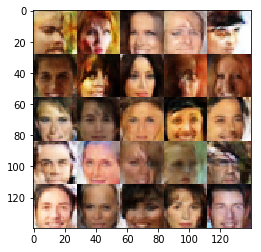

Epoch 1/1... Discriminator Loss: 0.9080... Generator Loss: 0.9158
Epoch 1/1... Discriminator Loss: 1.2704... Generator Loss: 0.8736
Epoch 1/1... Discriminator Loss: 1.0714... Generator Loss: 0.7900
Epoch 1/1... Discriminator Loss: 0.8725... Generator Loss: 1.3532
Epoch 1/1... Discriminator Loss: 1.1642... Generator Loss: 0.6750
Epoch 1/1... Discriminator Loss: 1.1450... Generator Loss: 0.8392
Epoch 1/1... Discriminator Loss: 1.2172... Generator Loss: 0.6869
Epoch 1/1... Discriminator Loss: 0.9079... Generator Loss: 1.7723
Epoch 1/1... Discriminator Loss: 0.9680... Generator Loss: 0.9992
Epoch 1/1... Discriminator Loss: 0.9367... Generator Loss: 1.3652


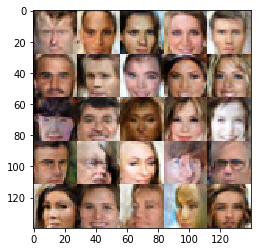

Epoch 1/1... Discriminator Loss: 1.3938... Generator Loss: 0.5179
Epoch 1/1... Discriminator Loss: 1.0649... Generator Loss: 0.9087
Epoch 1/1... Discriminator Loss: 1.0054... Generator Loss: 0.7737
Epoch 1/1... Discriminator Loss: 1.5333... Generator Loss: 0.4530
Epoch 1/1... Discriminator Loss: 1.3118... Generator Loss: 0.5352
Epoch 1/1... Discriminator Loss: 1.1141... Generator Loss: 1.2984
Epoch 1/1... Discriminator Loss: 0.8784... Generator Loss: 1.4061
Epoch 1/1... Discriminator Loss: 1.0401... Generator Loss: 0.8017
Epoch 1/1... Discriminator Loss: 1.1567... Generator Loss: 0.6057
Epoch 1/1... Discriminator Loss: 0.9087... Generator Loss: 1.0899


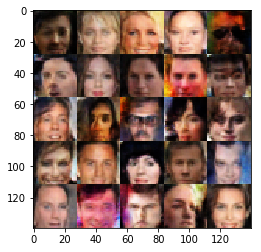

Epoch 1/1... Discriminator Loss: 1.1497... Generator Loss: 0.7446
Epoch 1/1... Discriminator Loss: 0.9580... Generator Loss: 1.0784
Epoch 1/1... Discriminator Loss: 1.0472... Generator Loss: 1.0768
Epoch 1/1... Discriminator Loss: 1.3069... Generator Loss: 2.2528
Epoch 1/1... Discriminator Loss: 1.1807... Generator Loss: 0.7763
Epoch 1/1... Discriminator Loss: 1.1763... Generator Loss: 0.7054
Epoch 1/1... Discriminator Loss: 1.1561... Generator Loss: 0.7823
Epoch 1/1... Discriminator Loss: 1.2176... Generator Loss: 0.7543
Epoch 1/1... Discriminator Loss: 1.2343... Generator Loss: 0.6756
Epoch 1/1... Discriminator Loss: 1.1216... Generator Loss: 0.8332


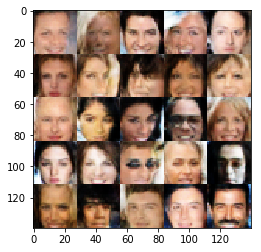

Epoch 1/1... Discriminator Loss: 0.7965... Generator Loss: 1.2586
Epoch 1/1... Discriminator Loss: 1.1608... Generator Loss: 0.7583
Epoch 1/1... Discriminator Loss: 1.3903... Generator Loss: 0.7507
Epoch 1/1... Discriminator Loss: 1.0960... Generator Loss: 0.7603
Epoch 1/1... Discriminator Loss: 0.8046... Generator Loss: 1.6167
Epoch 1/1... Discriminator Loss: 0.8784... Generator Loss: 1.4166
Epoch 1/1... Discriminator Loss: 1.1742... Generator Loss: 0.7028
Epoch 1/1... Discriminator Loss: 0.8327... Generator Loss: 1.8533
Epoch 1/1... Discriminator Loss: 0.8937... Generator Loss: 0.9514
Epoch 1/1... Discriminator Loss: 0.9655... Generator Loss: 1.7091


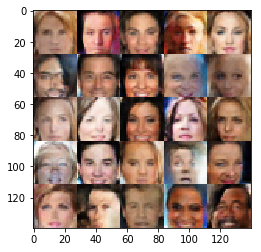

Epoch 1/1... Discriminator Loss: 0.9936... Generator Loss: 0.9440
Epoch 1/1... Discriminator Loss: 0.8666... Generator Loss: 1.2795
Epoch 1/1... Discriminator Loss: 0.9653... Generator Loss: 0.8903
Epoch 1/1... Discriminator Loss: 0.9274... Generator Loss: 1.0607
Epoch 1/1... Discriminator Loss: 1.2822... Generator Loss: 0.6334
Epoch 1/1... Discriminator Loss: 1.6386... Generator Loss: 0.4552
Epoch 1/1... Discriminator Loss: 0.7705... Generator Loss: 1.2857
Epoch 1/1... Discriminator Loss: 1.0810... Generator Loss: 0.7619
Epoch 1/1... Discriminator Loss: 0.9938... Generator Loss: 0.9391
Epoch 1/1... Discriminator Loss: 1.3537... Generator Loss: 0.5250


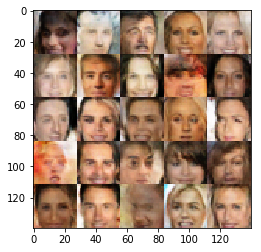

Epoch 1/1... Discriminator Loss: 1.3454... Generator Loss: 0.7211
Epoch 1/1... Discriminator Loss: 1.1517... Generator Loss: 0.6123
Epoch 1/1... Discriminator Loss: 1.2620... Generator Loss: 0.5807
Epoch 1/1... Discriminator Loss: 0.7534... Generator Loss: 1.1451
Epoch 1/1... Discriminator Loss: 1.1190... Generator Loss: 0.6700
Epoch 1/1... Discriminator Loss: 1.0533... Generator Loss: 1.4924
Epoch 1/1... Discriminator Loss: 1.0992... Generator Loss: 0.6938
Epoch 1/1... Discriminator Loss: 1.3268... Generator Loss: 0.5183
Epoch 1/1... Discriminator Loss: 1.0603... Generator Loss: 0.7461
Epoch 1/1... Discriminator Loss: 0.9488... Generator Loss: 0.9788


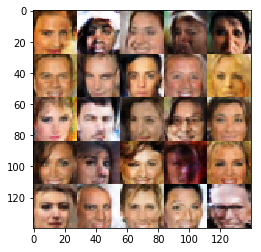

Epoch 1/1... Discriminator Loss: 1.0709... Generator Loss: 0.8203
Epoch 1/1... Discriminator Loss: 1.3745... Generator Loss: 0.5636
Epoch 1/1... Discriminator Loss: 1.2716... Generator Loss: 0.4979
Epoch 1/1... Discriminator Loss: 1.1749... Generator Loss: 0.7267
Epoch 1/1... Discriminator Loss: 1.5640... Generator Loss: 0.4414
Epoch 1/1... Discriminator Loss: 1.4849... Generator Loss: 0.5281
Epoch 1/1... Discriminator Loss: 1.1826... Generator Loss: 1.5154
Epoch 1/1... Discriminator Loss: 1.0467... Generator Loss: 1.3627
Epoch 1/1... Discriminator Loss: 1.9170... Generator Loss: 0.2644
Epoch 1/1... Discriminator Loss: 0.8333... Generator Loss: 1.4379


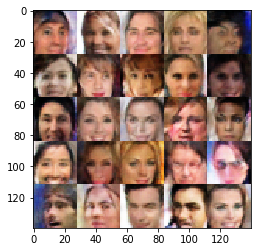

Epoch 1/1... Discriminator Loss: 1.4289... Generator Loss: 0.4879
Epoch 1/1... Discriminator Loss: 0.9497... Generator Loss: 0.8991
Epoch 1/1... Discriminator Loss: 1.3640... Generator Loss: 0.4549
Epoch 1/1... Discriminator Loss: 1.4757... Generator Loss: 0.5093
Epoch 1/1... Discriminator Loss: 0.9783... Generator Loss: 1.8801
Epoch 1/1... Discriminator Loss: 1.0022... Generator Loss: 0.9818
Epoch 1/1... Discriminator Loss: 1.5810... Generator Loss: 0.5182
Epoch 1/1... Discriminator Loss: 1.4105... Generator Loss: 0.4103
Epoch 1/1... Discriminator Loss: 1.1698... Generator Loss: 0.6020
Epoch 1/1... Discriminator Loss: 0.9822... Generator Loss: 0.9784


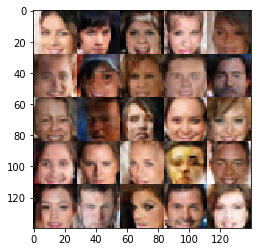

Epoch 1/1... Discriminator Loss: 0.9412... Generator Loss: 1.5800
Epoch 1/1... Discriminator Loss: 1.3481... Generator Loss: 0.5392
Epoch 1/1... Discriminator Loss: 0.9754... Generator Loss: 1.1495
Epoch 1/1... Discriminator Loss: 0.9338... Generator Loss: 0.9801
Epoch 1/1... Discriminator Loss: 1.2285... Generator Loss: 0.5925
Epoch 1/1... Discriminator Loss: 0.9694... Generator Loss: 0.7650
Epoch 1/1... Discriminator Loss: 1.0199... Generator Loss: 1.0049
Epoch 1/1... Discriminator Loss: 0.8289... Generator Loss: 1.3374
Epoch 1/1... Discriminator Loss: 1.0804... Generator Loss: 0.7367
Epoch 1/1... Discriminator Loss: 0.9685... Generator Loss: 1.0882


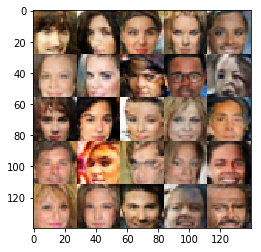

Epoch 1/1... Discriminator Loss: 1.0969... Generator Loss: 0.8720
Epoch 1/1... Discriminator Loss: 2.4659... Generator Loss: 0.2128
Epoch 1/1... Discriminator Loss: 1.2117... Generator Loss: 0.6602
Epoch 1/1... Discriminator Loss: 0.8854... Generator Loss: 1.4054
Epoch 1/1... Discriminator Loss: 1.3246... Generator Loss: 0.6570
Epoch 1/1... Discriminator Loss: 1.2165... Generator Loss: 0.6297
Epoch 1/1... Discriminator Loss: 1.2430... Generator Loss: 0.5520
Epoch 1/1... Discriminator Loss: 0.8453... Generator Loss: 1.6584
Epoch 1/1... Discriminator Loss: 1.6025... Generator Loss: 0.4083
Epoch 1/1... Discriminator Loss: 1.4709... Generator Loss: 0.4823


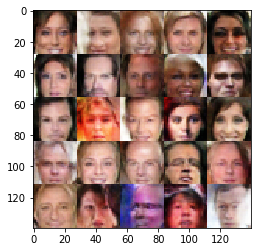

Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 1.0339
Epoch 1/1... Discriminator Loss: 1.6768... Generator Loss: 0.3980
Epoch 1/1... Discriminator Loss: 0.9169... Generator Loss: 1.3017
Epoch 1/1... Discriminator Loss: 0.9033... Generator Loss: 1.3983
Epoch 1/1... Discriminator Loss: 0.9305... Generator Loss: 0.9464
Epoch 1/1... Discriminator Loss: 1.1707... Generator Loss: 0.7480
Epoch 1/1... Discriminator Loss: 1.0077... Generator Loss: 1.2819
Epoch 1/1... Discriminator Loss: 0.9646... Generator Loss: 1.0435
Epoch 1/1... Discriminator Loss: 0.6138... Generator Loss: 1.8374
Epoch 1/1... Discriminator Loss: 1.4535... Generator Loss: 0.4024


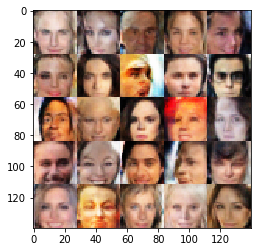

Epoch 1/1... Discriminator Loss: 0.9034... Generator Loss: 0.9374
Epoch 1/1... Discriminator Loss: 1.0196... Generator Loss: 0.9282
Epoch 1/1... Discriminator Loss: 1.2274... Generator Loss: 0.7209
Epoch 1/1... Discriminator Loss: 1.0962... Generator Loss: 0.8033
Epoch 1/1... Discriminator Loss: 1.1184... Generator Loss: 0.8614
Epoch 1/1... Discriminator Loss: 1.2122... Generator Loss: 0.5572


In [23]:
batch_size = 16
z_dim = 100
learning_rate = 0.00045
beta1 = 0.21


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.